In [ ]:
!pip install earth2studio[fcn]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 3.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of gcsfs to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 97.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.0/806.0 kB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.3/199.3 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.4/276.4 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 96.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.1/343.1 kB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 12.3 MB/s 

In [ ]:
from earth2studio.models.px.fcn import FCN
from earth2studio.data import GFS
from earth2studio.data import NCAR_ERA5
from earth2studio.io import NetCDF4Backend
from earth2studio.run import deterministic as run

model = FCN.load_model(FCN.load_default_package())
ds = GFS()
io = NetCDF4Backend("output.nc")

run(["2025-10-20"], 10, model, ds, io)

2025-10-21 20:43:43.640 | INFO     | earth2studio.run:deterministic:75 - Running simple workflow!
2025-10-21 20:43:43.640 | INFO     | earth2studio.run:deterministic:82 - Inference device: cuda


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:43:44.833 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 409472280-832323
2025-10-21 20:43:44.839 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 401992051-962991
2025-10-21 20:43:44.844 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 261403934-798772
2025-10-21 20:43:44.849 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208200736-716947
2025-10-21 20:43:44.854 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262202706-714089
2025-10-21 20:43:44.858 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS 

Fetching GFS data: 100%|██████████| 26/26 [00:03<00:00,  7.63it/s]


2025-10-21 20:43:48.422 | SUCCESS  | earth2studio.run:deterministic:106 - Fetched data from GFS
2025-10-21 20:43:48.437 | INFO     | earth2studio.run:deterministic:136 - Inference starting!



Running inference: 100%|██████████| 11/11 [00:25<00:00,  2.33s/it]

2025-10-21 20:44:14.079 | SUCCESS  | earth2studio.run:deterministic:146 - Inference complete


In [ ]:
import xarray as xr
ds_fcn = xr.open_dataset('output.nc')
ds_fcn

<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, lead_time: 11, lat: 720, lon: 1440)
Coordinates:
  * time       (time) datetime64[ns] 8B 2025-10-20
  * lead_time  (lead_time) int64 88B 0 6 12 18 24 30 36 42 48 54 60
  * lat        (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon        (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables: (12/26)
    u10m       (time, lead_time, lat, lon) float32 46MB ...
    v10m       (time, lead_time, lat, lon) float32 46MB ...
    t2m        (time, lead_time, lat, lon) float32 46MB ...
    sp         (time, lead_time, lat, lon) float32 46MB ...
    msl        (time, lead_time, lat, lon) float32 46MB ...
    t850       (time, lead_time, lat, lon) float32 46MB ...
    ...         ...
    u100m      (time, lead_time, lat, lon) float32 46MB ...
    v100m      (time, lead_time, lat, lon) float32 46MB ...
    u250       (time, lead_time, lat, lon) float32 46MB ...
    v250       (time, lead_time, lat, lon) float32 46MB ...
    z250       (time, lead_time, lat, lon) float32 46MB ...
    t250       (time, lead_time, lat, lon) float32 46MB ...

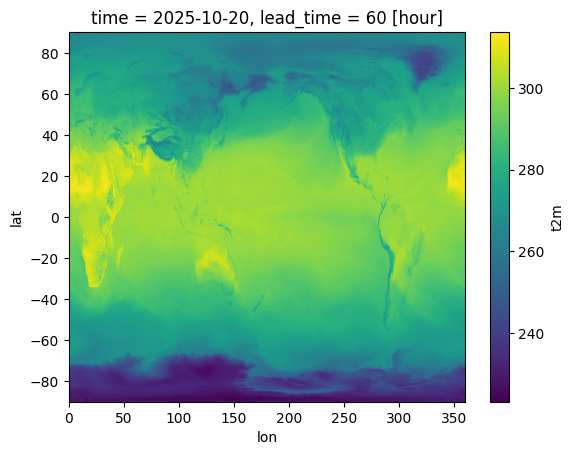

In [ ]:
ds_fcn.t2m.isel(time=0, lead_time=10).plot()

# Diagnostic

In [ ]:
!pip -q install --upgrade pip
!pip -q install "earth2studio[dlwp] @ git+https://github.com/NVIDIA/earth2studio.git" cartopy xarray zarr cfgrib s3fs python-dotenv
!apt-get -qq update && apt-get -y -qq install eccodes libeccodes0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
E: Unable to locate package eccodes


In [ ]:
START_DATE = "2025-10-20"  # <-- match your FCN run
NSTEPS = 10                # <-- match your FCN run
OUTDIR = "outputs"
import os; os.makedirs(OUTDIR, exist_ok=True)

In [ ]:
from earth2studio.models.px import FCN                    # prognostic
from earth2studio.models.dx import PrecipitationAFNO      # diagnostic
from earth2studio.data import GFS
from earth2studio.io import ZarrBackend
import earth2studio.run as run

# Load FCN prognostic
prognostic_model = FCN.load_model(FCN.load_default_package())

# Load AFNO precipitation diagnostic
diagnostic_model = PrecipitationAFNO.load_model(PrecipitationAFNO.load_default_package())

# Data & IO
data = GFS()
io = ZarrBackend(f"{OUTDIR}/diagnostic_output.zarr")

# Run prognostic + diagnostic together
io = run.diagnostic([START_DATE], NSTEPS, prognostic_model, diagnostic_model, data, io)

# Optional: peek at saved arrays
try:
    print(io.root.tree())
except Exception as e:
    print("[WARN] Could not print IO tree:", e)

2025-10-21 20:53:48.163 | INFO     | earth2studio.run:diagnostic:190 - Running diagnostic workflow!
2025-10-21 20:53:48.163 | INFO     | earth2studio.run:diagnostic:197 - Inference device: cuda


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:48.354 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 401992051-962991


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:48.402 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 156716215-734650
2025-10-21 20:53:48.444 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 402955042-950150
2025-10-21 20:53:48.487 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262916795-804739
2025-10-21 20:53:48.529 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 407434672-983122


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:48.588 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 339721129-864412


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:48.635 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 344810557-934305
2025-10-21 20:53:48.677 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 429966043-1191243
2025-10-21 20:53:48.718 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 345744862-943249
2025-10-21 20:53:48.760 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 467459274-969918


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:48.802 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 423243355-942581


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:48.847 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 337994712-891002
2025-10-21 20:53:48.890 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 468429192-960501
2025-10-21 20:53:48.932 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 417938635-871000
2025-10-21 20:53:48.974 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 267594802-953091


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:49.016 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 214205506-580558


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:49.060 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 409472280-832323
2025-10-21 20:53:49.103 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 268547893-913193
2025-10-21 20:53:49.147 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 214786064-587600
2025-10-21 20:53:49.191 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 0-992911


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:53:49.234 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 261403934-798772


Fetching GFS data:   0%|          | 0/26 [00:01<?, ?it/s]

2025-10-21 20:53:49.281 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208200736-716947
2025-10-21 20:53:49.329 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 422282376-960979
2025-10-21 20:53:49.370 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 338885714-835415
2025-10-21 20:53:49.415 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262202706-714089


Fetching GFS data:   0%|          | 0/26 [00:01<?, ?it/s]

2025-10-21 20:53:49.463 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208917683-730404


Fetching GFS data: 100%|██████████| 26/26 [00:01<00:00, 22.42it/s]


2025-10-21 20:53:49.710 | SUCCESS  | earth2studio.run:diagnostic:220 - Fetched data from GFS
2025-10-21 20:53:49.737 | INFO     | earth2studio.run:diagnostic:252 - Inference starting!



Running inference: 100%|██████████| 11/11 [00:17<00:00,  1.55s/it]

2025-10-21 20:54:06.820 | SUCCESS  | earth2studio.run:diagnostic:266 - Inference complete


/
├── lat (720,) float64
├── lead_time (11,) timedelta64
├── lon (1440,) float64
├── time (1,) datetime64
└── tp (1, 11, 720, 1440) float32

Saved map -> outputs/tp_prediction.png


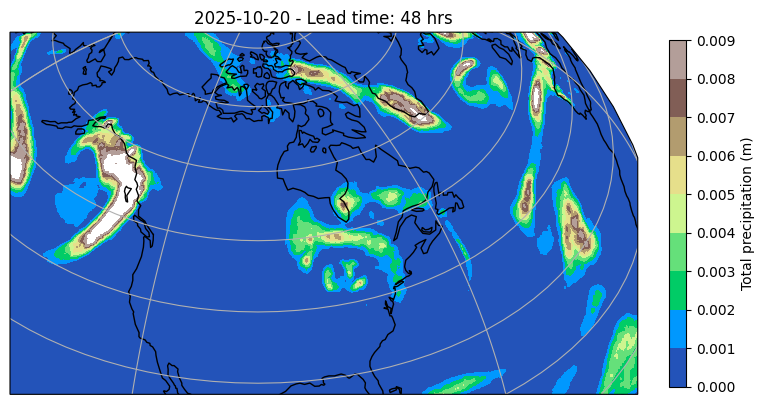

In [ ]:
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

variable = "tp"            # total precipitation (meters)
step = min(8, NSTEPS)      # e.g., lead time ~ 6*step hours
forecast = datetime.fromisoformat(START_DATE)

lon = io["lon"][:]
lat = io["lat"][:]
field = io[variable][0, step]   # shape: (lat, lon)

plt.close("all")
projection = ccrs.Orthographic(-100, 40)  # CONUS-ish view
fig, ax = plt.subplots(subplot_kw={"projection": projection}, figsize=(10, 6))

levels = np.arange(0.0, 0.01, 0.001)
im = ax.contourf(
    lon, lat, field,
    levels,
    transform=ccrs.PlateCarree(),
    vmax=0.01, vmin=0.0,
    cmap="terrain",
)

ax.set_title(f"{forecast.strftime('%Y-%m-%d')} - Lead time: {6*step} hrs")
ax.set_extent([220, 340, 20, 70])  # [lon min, lon max, lat min, lat max]
ax.coastlines(); ax.gridlines(draw_labels=False)
plt.colorbar(im, ax=ax, ticks=levels, shrink=0.75, pad=0.04, label="Total precipitation (m)")
plt.savefig(f"{OUTDIR}/tp_prediction.png", dpi=150, bbox_inches="tight")
print("Saved map ->", f"{OUTDIR}/tp_prediction.png")

2025-10-21 20:55:43.106 | INFO     | earth2studio.run:diagnostic:190 - Running diagnostic workflow!
2025-10-21 20:55:43.107 | INFO     | earth2studio.run:diagnostic:197 - Inference device: cuda


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:55:43.118 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 344810557-934305
2025-10-21 20:55:43.167 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262916795-804739
2025-10-21 20:55:43.208 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 402955042-950150
2025-10-21 20:55:43.251 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 345744862-943249
2025-10-21 20:55:43.292 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 339721129-864412


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:55:43.352 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 156716215-734650
2025-10-21 20:55:43.476 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 417938635-871000
2025-10-21 20:55:43.543 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 337994712-891002


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:55:43.629 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 338885714-835415
2025-10-21 20:55:43.723 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 409472280-832323


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 20:55:43.899 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 268547893-913193
2025-10-21 20:55:44.066 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 422282376-960979


Fetching GFS data:   0%|          | 0/26 [00:01<?, ?it/s]

2025-10-21 20:55:44.198 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 401992051-962991
2025-10-21 20:55:44.243 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 429966043-1191243
2025-10-21 20:55:44.284 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 267594802-953091
2025-10-21 20:55:44.325 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 423243355-942581
2025-10-21 20:55:44.365 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 467459274-969918


Fetching GFS data:   0%|          | 0/26 [00:01<?, ?it/s]

2025-10-21 20:55:44.406 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 261403934-798772
2025-10-21 20:55:44.449 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 0-992911
2025-10-21 20:55:44.491 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 468429192-960501
2025-10-21 20:55:44.533 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262202706-714089
2025-10-21 20:55:44.573 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208917683-730404


Fetching GFS data: 100%|██████████| 26/26 [00:01<00:00, 15.60it/s]


2025-10-21 20:55:44.618 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 214205506-580558
2025-10-21 20:55:44.659 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208200736-716947
2025-10-21 20:55:44.698 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 214786064-587600
2025-10-21 20:55:44.742 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 407434672-983122
2025-10-21 20:55:44.974 | SUCCESS  | earth2studio.run:diagnostic:220 - Fetched data from GFS
2025-10-21 20:55:44.981 | INFO     | earth2studio.run:diagnostic:252 - Inference starting!



Running inference: 100%|██████████| 11/11 [00:14<00:00,  1.34s/it]

2025-10-21 20:55:59.725 | SUCCESS  | earth2studio.run:diagnostic:266 - Inference complete


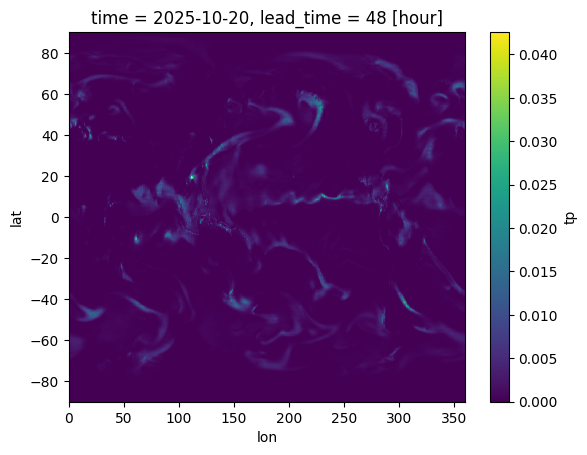

In [ ]:
from earth2studio.io import NetCDF4Backend
io = NetCDF4Backend(f"{OUTDIR}/diagnostic_output.nc")
io = run.diagnostic([START_DATE], NSTEPS, prognostic_model, diagnostic_model, data, io)

# Open with xarray
import xarray as xr
ds_diag = xr.open_dataset(f"{OUTDIR}/diagnostic_output.nc")
ds_diag["tp"].isel(time=0, lead_time=step).plot()

# Cordiff

In [ ]:
# same spirit as your cell
!pip -q install --upgrade pip
!pip -q install "earth2studio[corrdiff] @ git+https://github.com/NVIDIA/earth2studio.git" cartopy xarray zarr cfgrib s3fs python-dotenv
!apt-get -qq update && apt-get -y -qq install eccodes libeccodes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 39.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.
datasets 4.0.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2025.9.0 which is incompatible.
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
E: Unable to locate package eccodes
E: Unable to locate package libeccodes


# Run Prognostic

In [ ]:
# 0) Clean slate + same paths everywhere
OUTDIR = "/content/outputs"   # absolute path to avoid cwd confusion
FCN_ZARR = f"{OUTDIR}/diagnostic_output.zarr"

import os
os.makedirs(OUTDIR, exist_ok=True)
print("OUTDIR:", OUTDIR)

OUTDIR: /content/outputs


In [ ]:
# 1) FCN + AFNO run that WRITES to the same FCN_ZARR we’ll read from
from earth2studio.models.px import FCN                    # prognostic
from earth2studio.models.dx import PrecipitationAFNO      # diagnostic
from earth2studio.data import GFS
from earth2studio.io import ZarrBackend
import earth2studio.run as run

START_DATE = "2025-10-20"
NSTEPS = 10

prognostic_model = FCN.load_model(FCN.load_default_package())
diagnostic_model = PrecipitationAFNO.load_model(PrecipitationAFNO.load_default_package())

data = GFS()
io = ZarrBackend(FCN_ZARR)

io = run.diagnostic([START_DATE], NSTEPS, prognostic_model, diagnostic_model, data, io)

# sanity check: list what got written
try:
    print(io.root.tree())
except Exception as e:
    print("[WARN] Could not print IO tree:", e)

2025-10-21 21:48:24.697 | INFO     | earth2studio.run:diagnostic:190 - Running diagnostic workflow!
2025-10-21 21:48:24.697 | INFO     | earth2studio.run:diagnostic:197 - Inference device: cuda


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-21 21:48:26.214 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 261403934-798772
2025-10-21 21:48:26.221 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208200736-716947
2025-10-21 21:48:26.227 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 407434672-983122
2025-10-21 21:48:26.233 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262202706-714089
2025-10-21 21:48:26.236 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208917683-730404
2025-10-21 21:48:26.246 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS 

Fetching GFS data: 100%|██████████| 26/26 [00:03<00:00,  7.58it/s]


2025-10-21 21:48:29.895 | SUCCESS  | earth2studio.run:diagnostic:220 - Fetched data from GFS
2025-10-21 21:48:29.928 | INFO     | earth2studio.run:diagnostic:252 - Inference starting!



Running inference: 100%|██████████| 11/11 [00:17<00:00,  1.60s/it]

2025-10-21 21:48:47.552 | SUCCESS  | earth2studio.run:diagnostic:266 - Inference complete


/
├── lat (720,) float64
├── lead_time (11,) timedelta64
├── lon (1440,) float64
├── time (1,) datetime64
└── tp (1, 11, 720, 1440) float32

In [ ]:
# 2) Verify the file truly exists on disk
import os, glob
print("Exists?", os.path.exists(FCN_ZARR))
print("Zarr contents sample:", glob.glob(f"{FCN_ZARR}/*")[:10])

Exists? True
Zarr contents sample: ['/content/outputs/diagnostic_output.zarr/tp', '/content/outputs/diagnostic_output.zarr/zarr.json', '/content/outputs/diagnostic_output.zarr/lead_time', '/content/outputs/diagnostic_output.zarr/time', '/content/outputs/diagnostic_output.zarr/lat', '/content/outputs/diagnostic_output.zarr/lon']


In [ ]:
from collections import OrderedDict
from datetime import datetime
import numpy as np
import xarray as xr

from earth2studio.data import DataSource, prep_data_array
from earth2studio.io import ZarrBackend
from earth2studio.models.dx import CorrDiffTaiwan
from earth2studio.utils.coords import map_coords, split_coords
from earth2studio.utils.time import to_time_array

FCN_ZARR = "outputs/diagnostic_output.zarr"   # from your FCN+AFNO run
CORRDIFF_OUT = "outputs/corrdiff_output.zarr"
START_DATE = "2025-10-20"   # same as FCN
N_SAMPLES = 2               # generate 2 CorrDiff samples (change as you like)

# --- minimal alias map (expand if your FCN uses different names) ---
ALIAS = {
    "t2m": ["t2m", "2t", "T2M"],
    "u10m": ["u10m", "10u", "U10M"],
    "v10m": ["v10m", "10v", "V10M"],
    "mslp": ["mslp", "msl", "MSLP"],
    "tp": ["tp", "prate", "precip", "tp6h", "tp1h"],  # will be ignored if CorrDiff doesn’t request it
}

def _resolve_var(ds: xr.Dataset, var: str):
    if var in ds:
        return var
    for cand in ALIAS.get(var, []):
        if cand in ds:
            return cand
    raise KeyError(f"Could not find variable '{var}' (aliases: {ALIAS.get(var, [])}) in FCN Zarr")

class FCNZarrSource(DataSource):
    """Expose FCN Zarr outputs to Earth2Studio models as a DataSource."""
    def __init__(self, path: str):
        self.ds = xr.open_zarr(path, consolidated=False)

    def __call__(self, time, variables):
        # time -> np.datetime64; nearest match
        times = to_time_array(time)
        t0 = np.datetime64(times[0])
        # Select nearest along 'time' (FCN outputs are typically at fixed steps)
        da_list = []
        for v in variables:
            name = _resolve_var(self.ds, v)
            da = self.ds[name].sel(time=t0, method="nearest")
            da_list.append(da)

        # Stack variables into a single DataArray with coord "variable"
        stacked = xr.concat(da_list, dim="variable")
        stacked = stacked.assign_coords(variable=("variable", list(variables)))
        # Ensure lat/lon dim names
        for old, new in [("latitude","lat"), ("longitude","lon")]:
            if old in stacked.dims:
                stacked = stacked.rename({old:new})
        return stacked

# # --- Init CorrDiff model & IO ---
# corrdiff = CorrDiffTaiwan.load_model(CorrDiffTaiwan.load_default_package())  # Taiwan checkpoint
# data = FCNZarrSource(FCN_ZARR)  # <-- our adapter
# io = ZarrBackend(CORRDIFF_OUT)

# # --- Run CorrDiff workflow (diagnostic, instantaneous per timestamp) ---
# from loguru import logger
# import torch

# def run_corrdiff(time_list, corrdiff, data, io, number_of_samples=1):
#     logger.info("Running CorrDiff on FCN output…")
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     logger.info(f"Inference device: {device}")
#     corrdiff = corrdiff.to(device)
#     corrdiff.number_of_samples = number_of_samples

#     # fetch inputs CorrDiff expects from our FCN Zarr
#     time = to_time_array(time_list)
#     x, coords = prep_data_array(data(time, corrdiff.input_coords()["variable"]), device=device)
#     x, coords = map_coords(x, coords, corrdiff.input_coords())

#     # prepare output coords & allocate IO arrays
#     out_coords = corrdiff.output_coords(corrdiff.input_coords())
#     total_coords = OrderedDict({
#         "time": coords["time"],
#         "sample": out_coords["sample"],
#         "lat": out_coords["lat"],
#         "lon": out_coords["lon"],
#     })
#     io.add_array(total_coords, out_coords["variable"])

#     x, coords = corrdiff(x, coords)  # inference
#     io.write(*split_coords(x, coords))
#     return io

# io = run_corrdiff([START_DATE], corrdiff, data, io, number_of_samples=N_SAMPLES)

# try:
#     print(io.root.tree())
# except Exception as e:
#     print("[WARN] Could not print IO tree:", e)

In [ ]:
# FCN → write a forecast with the *state* variables CorrDiff expects
from earth2studio.models.px import FCN
from earth2studio.data import GFS
from earth2studio.io import ZarrBackend   # use Zarr so the next step can read it directly
import earth2studio.run as run

START_DATE = "2025-10-20"
NSTEPS = 10
FCN_ZARR = "/content/outputs/fcn_forecast.zarr"

model = FCN.load_model(FCN.load_default_package())
ds = GFS()
io = ZarrBackend(FCN_ZARR)

# PROGNOSTIC run (not diagnostic)
io = run.deterministic([START_DATE], NSTEPS, model, ds, io)

try:
    print(io.root.tree())
except Exception as e:
    print("[WARN] Could not print IO tree:", e)

2025-10-27 02:09:48.608 | INFO     | earth2studio.run:deterministic:75 - Running simple workflow!
2025-10-27 02:09:48.608 | INFO     | earth2studio.run:deterministic:82 - Inference device: cuda


Fetching GFS data:   0%|          | 0/26 [00:00<?, ?it/s]

2025-10-27 02:09:50.390 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 409472280-832323
2025-10-27 02:09:50.395 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 261403934-798772
2025-10-27 02:09:50.401 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208200736-716947
2025-10-27 02:09:50.406 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 262202706-714089
2025-10-27 02:09:50.410 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS grib file: noaa-gfs-bdp-pds/gfs.20251020/00/atmos/gfs.t00z.pgrb2.0p25.f000 208917683-730404
2025-10-27 02:09:50.415 | DEBUG    | earth2studio.data.gfs:fetch_array:380 - Fetching GFS 

Fetching GFS data: 100%|██████████| 26/26 [00:04<00:00,  6.41it/s]


2025-10-27 02:09:54.640 | SUCCESS  | earth2studio.run:deterministic:106 - Fetched data from GFS
2025-10-27 02:09:54.734 | INFO     | earth2studio.run:deterministic:136 - Inference starting!



Running inference: 100%|██████████| 11/11 [01:18<00:00,  7.12s/it]

2025-10-27 02:11:13.053 | SUCCESS  | earth2studio.run:deterministic:146 - Inference complete


/
├── lat (720,) float64
├── lead_time (11,) timedelta64
├── lon (1440,) float64
├── msl (1, 11, 720, 1440) float32
├── r500 (1, 11, 720, 1440) float32
├── r850 (1, 11, 720, 1440) float32
├── sp (1, 11, 720, 1440) float32
├── t250 (1, 11, 720, 1440) float32
├── t2m (1, 11, 720, 1440) float32
├── t500 (1, 11, 720, 1440) float32
├── t850 (1, 11, 720, 1440) float32
├── tcwv (1, 11, 720, 1440) float32
├── time (1,) datetime64
├── u1000 (1, 11, 720, 1440) float32
├── u100m (1, 11, 720, 1440) float32
├── u10m (1, 11, 720, 1440) float32
├── u250 (1, 11, 720, 1440) float32
├── u500 (1, 11, 720, 1440) float32
├── u850 (1, 11, 720, 1440) float32
├── v1000 (1, 11, 720, 1440) float32
├── v100m (1, 11, 720, 1440) float32
├── v10m (1, 11, 720, 1440) float32
├── v250 (1, 11, 720, 1440) float32
├── v500 (1, 11, 720, 1440) float32
├── v850 (1, 11, 720, 1440) float32
├── z1000 (1, 11, 720, 1440) float32
├── z250 (1, 11, 720, 1440) float32
├── z50 (1, 11, 720, 1440) float32
├── z500 (1, 11, 720, 1440) float32
└── z850 (1, 11, 720, 1440) float32

In [ ]:
import xarray as xr
from earth2studio.models.dx import CorrDiffTaiwan

ds = xr.open_zarr(FCN_ZARR, consolidated=False)
have = set(ds.data_vars)

corrdiff = CorrDiffTaiwan.load_model(CorrDiffTaiwan.load_default_package())
need = list(corrdiff.input_coords()["variable"])

print("Have (sample):", list(have)[:20])
print("Need:", need)
missing = [v for v in need if v not in have]
print("Missing:", missing)

Have (sample): ['v100m', 't850', 'z500', 'u250', 'u1000', 'v10m', 'u100m', 't500', 'tcwv', 'v500', 'v1000', 'r500', 'z50', 'v250', 'r850', 'sp', 'u500', 'u10m', 'z250', 't250']
Need: [np.str_('tcwv'), np.str_('z500'), np.str_('t500'), np.str_('u500'), np.str_('v500'), np.str_('z850'), np.str_('t850'), np.str_('u850'), np.str_('v850'), np.str_('t2m'), np.str_('u10m'), np.str_('v10m')]
Missing: []


In [ ]:
import numpy as np
import xarray as xr
import pandas as pd
from earth2studio.data import DataSource
from earth2studio.utils.time import to_time_array

LEAD_TIME_HOURS = 0  # choose: 0, 6, 12, ...

class FCNForecastSource(DataSource):
    def __init__(self, path: str, lead_time_hours: int = LEAD_TIME_HOURS):
        self.ds = xr.open_zarr(path, consolidated=False)
        self.lead_time_hours = int(lead_time_hours)

    def _nearest_lead_index(self, lt_da: xr.DataArray) -> int:
        """Return index of lead_time closest to self.lead_time_hours (in hours)."""
        # Normalize to integer hours *NumPy array*
        if np.issubdtype(lt_da.dtype, np.timedelta64):
            lt_h = (lt_da / np.timedelta64(1, "h")).astype("int64").values
        elif np.issubdtype(lt_da.dtype, np.integer):
            vals = lt_da.values
            # Heuristic: big numbers -> seconds; small -> hours
            lt_h = vals if vals.max() <= 240 else (vals // 3600)
        else:
            lt_h = (pd.to_timedelta(lt_da.values) / np.timedelta64(1, "h")).astype("int64")

        # Ensure plain NumPy array
        lt_h = np.asarray(lt_h).astype(np.int64)
        idx = int(np.argmin(np.abs(lt_h - self.lead_time_hours)))
        return idx

    def __call__(self, time, variables):
        t0 = np.datetime64(to_time_array(time)[0])

        ds = self.ds
        # Select desired lead (by index) robustly
        if "lead_time" in ds.dims:
            idx = self._nearest_lead_index(ds["lead_time"])
            ds = ds.isel(lead_time=idx)

        # Select nearest valid time, but keep a time axis of length 1
        if "time" in ds.dims:
            ds = ds.sel(time=t0, method="nearest")

        # Check variables
        missing = [v for v in variables if v not in ds]
        if missing:
            raise KeyError(f"Missing in FCN forecast: {missing}")

        # Stack in CorrDiff order
        stacked = xr.concat([ds[v] for v in variables], dim="variable")
        stacked = stacked.assign_coords(variable=("variable", list(variables)))

        # Normalize coord names
        rename = {}
        if "latitude" in stacked.dims:  rename["latitude"]  = "lat"
        if "longitude" in stacked.dims: rename["longitude"] = "lon"
        if rename:
            stacked = stacked.rename(rename)

        # Ensure a length-1 time dimension (some selects drop it)
        if "time" not in stacked.dims:
            stacked = stacked.expand_dims(time=[t0])

        # Tidy dim order
        want = [d for d in ["time", "variable", "lat", "lon"] if d in stacked.dims]
        stacked = stacked.transpose(*want)

        return stacked

In [ ]:
ds_dbg = xr.open_zarr(FCN_ZARR, consolidated=False)
print("lead_time dtype:", ds_dbg["lead_time"].dtype if "lead_time" in ds_dbg else None)
print("lead_time values (first 10):", ds_dbg["lead_time"].values[:10] if "lead_time" in ds_dbg else None)
print("dims:", ds_dbg.dims)

lead_time dtype: timedelta64[h]
lead_time values (first 10): [ 0  6 12 18 24 30 36 42 48 54]
dims: FrozenMappingWarningOnValuesAccess({'time': 1, 'lead_time': 11, 'lat': 720, 'lon': 1440})


In [ ]:
# --- Init CorrDiff model & IO ---
# 1) Point to the FCN *prognostic* Zarr that contains the needed vars
FCN_ZARR = "/content/outputs/fcn_forecast.zarr"

# 2) Initialize data source with the lead time you want (in hours)
data = FCNForecastSource(FCN_ZARR, lead_time_hours=0)  # or 6, 12, ...


corrdiff = CorrDiffTaiwan.load_model(CorrDiffTaiwan.load_default_package())
# data = FCNForecastSource(FCN_ZARR, lead_time_sel=LEAD_TIME_SEL)
io = ZarrBackend(CORRDIFF_OUT)

# --- Run CorrDiff ---
from loguru import logger
import torch

def run_corrdiff(time_list, corrdiff, data, io, number_of_samples=1):
    logger.info("Running CorrDiff on FCN output…")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logger.info(f"Inference device: {device}")
    corrdiff = corrdiff.to(device)
    corrdiff.number_of_samples = number_of_samples

    # Fetch inputs CorrDiff expects from our FCN Zarr
    x, coords = prep_data_array(
        data(time_list, corrdiff.input_coords()["variable"]), device=device
    )
    x, coords = map_coords(x, coords, corrdiff.input_coords())

    # Allocate IO
    out_coords = corrdiff.output_coords(corrdiff.input_coords())
    total_coords = OrderedDict({
        "time": coords["time"],
        "sample": out_coords["sample"],
        "lat": out_coords["lat"],
        "lon": out_coords["lon"],
    })
    io.add_array(total_coords, out_coords["variable"])

    # Inference
    x, coords = corrdiff(x, coords)
    io.write(*split_coords(x, coords))
    return io

io = run_corrdiff([START_DATE], corrdiff, data, io, number_of_samples=N_SAMPLES)

try:
    print(io.root.tree())
except Exception as e:
    print("[WARN] Could not print IO tree:", e)

2025-10-27 03:20:58.444 | INFO     | __main__:run_corrdiff:18 - Running CorrDiff on FCN output…
2025-10-27 03:20:58.444 | INFO     | __main__:run_corrdiff:20 - Inference device: cuda


/
├── ilat (448,) int64
├── ilon (448,) int64
├── lat (448, 448) float32
├── lon (448, 448) float32
├── mrr (1, 2, 448, 448) float32
├── sample (2,) int64
├── t2m (1, 2, 448, 448) float32
├── time (1,) datetime64
├── u10m (1, 2, 448, 448) float32
└── v10m (1, 2, 448, 448) float32

Vars: ['lat', 'v10m', 'mrr', 'lon', 'u10m', 't2m']
Dims: {'ilat': 448, 'ilon': 448, 'time': 1, 'sample': 2}


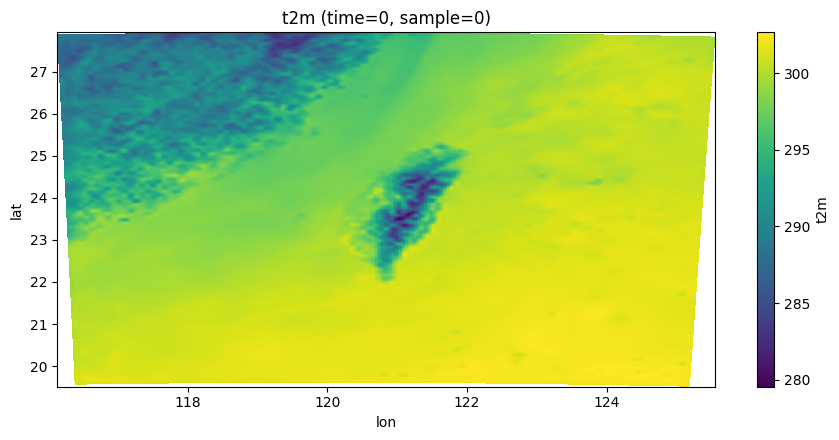

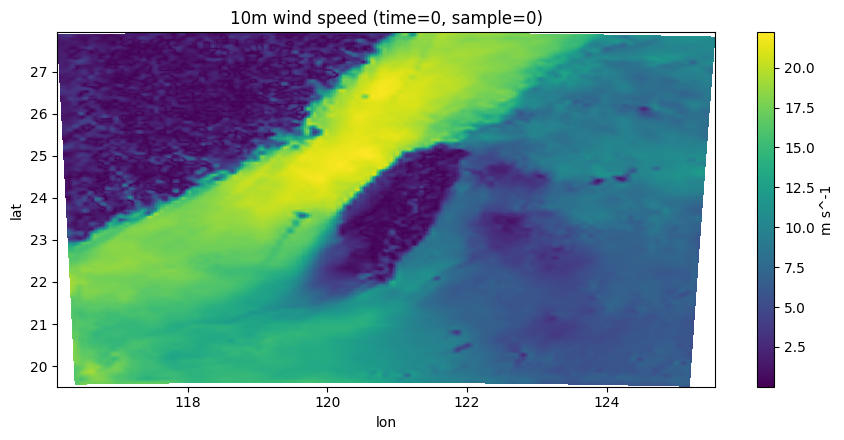

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

CORRDIFF_OUT = "/content/outputs/corrdiff_output.zarr"
ds = xr.open_zarr(CORRDIFF_OUT, consolidated=False)

print("Vars:", list(ds.data_vars))
print("Dims:", {k: int(v) for k,v in ds.dims.items()})

# pick a variable that's actually in your ds (e.g., "t2m" or "mrr")
var = "t2m" if "t2m" in ds else list(ds.data_vars)[0]

# sample/time indices (CorrDiff usually has time=1, sample>=1)
ti = 0
si = 0

field = ds[var].isel(time=ti, sample=si)
lon = ds["lon"].values
lat = ds["lat"].values

plt.figure(figsize=(9,4.5))
plt.pcolormesh(lon, lat, field.values)  # let matplotlib pick defaults
plt.xlabel("lon"); plt.ylabel("lat"); plt.title(f"{var} (time={ti}, sample={si})")
plt.colorbar(label=var)
plt.tight_layout()
plt.show()

# optional: 10m wind speed quick-look
if {"u10m","v10m"}.issubset(ds.data_vars):
    wspd = np.hypot(ds["u10m"].isel(time=ti, sample=si), ds["v10m"].isel(time=ti, sample=si))
    plt.figure(figsize=(9,4.5))
    plt.pcolormesh(lon, lat, wspd.values)
    plt.xlabel("lon"); plt.ylabel("lat"); plt.title(f"10m wind speed (time={ti}, sample={si})")
    plt.colorbar(label="m s^-1")
    plt.tight_layout()
    plt.show()


In [ ]:
ds

<xarray.Dataset> Size: 8MB
Dimensions:  (ilat: 448, ilon: 448, time: 1, sample: 2)
Coordinates:
  * ilat     (ilat) int64 4kB 0 1 2 3 4 5 6 7 ... 441 442 443 444 445 446 447
  * ilon     (ilon) int64 4kB 0 1 2 3 4 5 6 7 ... 441 442 443 444 445 446 447
  * time     (time) datetime64[ns] 8B 2025-10-20
  * sample   (sample) int64 16B 0 1
Data variables:
    lat      (ilat, ilon) float32 803kB dask.array<chunksize=(448, 448), meta=np.ndarray>
    v10m     (time, sample, ilat, ilon) float32 2MB dask.array<chunksize=(1, 2, 448, 448), meta=np.ndarray>
    mrr      (time, sample, ilat, ilon) float32 2MB dask.array<chunksize=(1, 2, 448, 448), meta=np.ndarray>
    lon      (ilat, ilon) float32 803kB dask.array<chunksize=(448, 448), meta=np.ndarray>
    u10m     (time, sample, ilat, ilon) float32 2MB dask.array<chunksize=(1, 2, 448, 448), meta=np.ndarray>
    t2m      (time, sample, ilat, ilon) float32 2MB dask.array<chunksize=(1, 2, 448, 448), meta=np.ndarray>

In [ ]:
ds_fcn = xr.open_zarr(FCN_ZARR, consolidated=False)
ds_fcn

<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, lead_time: 11, lat: 720, lon: 1440)
Coordinates:
  * time       (time) datetime64[ns] 8B 2025-10-20
  * lead_time  (lead_time) timedelta64[h] 88B 0 days 00:00:00 ... 2 days 12:0...
  * lat        (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon        (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables: (12/26)
    u850       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    z1000      (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    u1000      (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    v850       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    z500       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    r500       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    ...         ...
    t2m        (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    z50        (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    tcwv       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    t250       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    z850       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>
    u10m       (time, lead_time, lat, lon) float32 46MB dask.array<chunksize=(1, 11, 720, 1440), meta=np.ndarray>

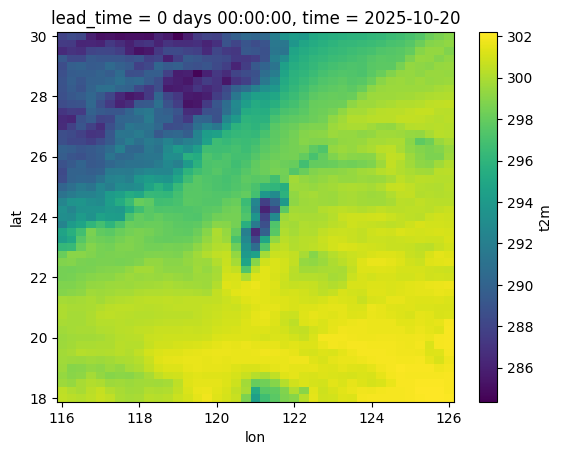

In [ ]:
ds_fcn.isel(lead_time=0).sel(lat=slice(30,18)).sel(lon=slice(116,126)).t2m.plot()

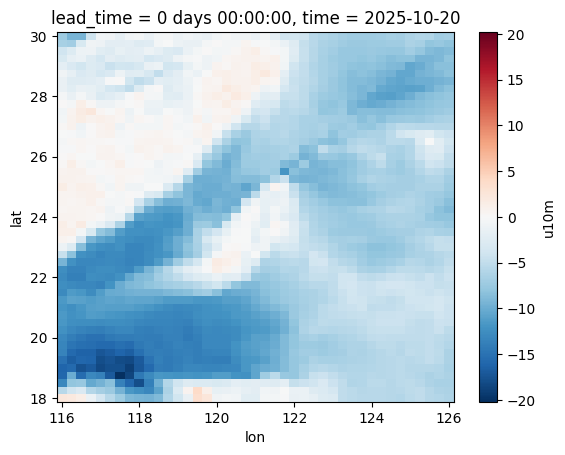

In [ ]:
ds_fcn.isel(lead_time=0).sel(lat=slice(30,18)).sel(lon=slice(116,126)).u10m.plot()

# Cant run cordiff over region other than Taiwan for now

# CBottle

In [ ]:
# --- 0) Setup (Colab) ---
# Make sure we have a GPU; will still run on CPU, just slower.
!nvidia-smi || echo "No NVIDIA GPU detected; running on CPU will be slow."

# Install stack (exact pins from your message)
!pip install -q hatchling
!pip install -q --no-build-isolation "earth2grid @ git+https://github.com/NVlabs/earth2grid@661445e2c68edc76f52632aa0528af482357f1b8"
!pip install -q --no-build-isolation "cbottle @ git+https://github.com/NickGeneva/cBottle.git@9250793894f8a9963f6968d62112884869fde3e1"
!pip install -q "earth2studio[cbottle] @ git+https://github.com/NVIDIA/earth2studio.git" cartopy xarray netCDF4

Mon Oct 27 21:26:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   66C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# cBottle Nov 2, 2025

In [1]:
# --- 0) Setup (Colab) ---
# Make sure we have a GPU; will still run on CPU, just slower.
!nvidia-smi || echo "No NVIDIA GPU detected; running on CPU will be slow."

# Install stack (exact pins from your message)
!pip install -q hatchling
!pip install -q --no-build-isolation "earth2grid @ git+https://github.com/NVlabs/earth2grid@661445e2c68edc76f52632aa0528af482357f1b8"
!pip install -q --no-build-isolation "cbottle @ git+https://github.com/NickGeneva/cBottle.git@9250793894f8a9963f6968d62112884869fde3e1"
!pip install -q "earth2studio[cbottle] @ git+https://github.com/NVIDIA/earth2studio.git" cartopy xarray netCDF4

Mon Nov  3 00:17:06 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   44C    P0             56W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [2]:
import os

os.makedirs("outputs", exist_ok=True)
from dotenv import load_dotenv

load_dotenv()  # TODO: make common example prep function

import torch

from earth2studio.data import WB2ERA5, CBottle3D
from earth2studio.models.dx import CBottleInfill

# Load the default model package which downloads the check point from NGC
package = CBottle3D.load_default_package()
cbottle_ds = CBottle3D.load_model(package)
# This is an AI data source, so also move it to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cbottle_ds = cbottle_ds.to(device)

# Create the ground truth data source
era5_ds = WB2ERA5()

2025-11-02 21:56:58.739 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/.zattrs to local cache
2025-11-02 21:56:58.893 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/.zmetadata to local cache
2025-11-02 21:56:58.894 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/.zgroup to local cache
2025-11-02 21:56:59.145 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/level/0 to local cache


In [3]:
from datetime import datetime

n_samples = 5
timestamp = datetime(2022, 9, 5)

# Fetch the ground truth
era5_da = era5_ds([timestamp], ["msl", "tcwv"])
# Generate some samples from cBottle
cbottle_da = cbottle_ds([timestamp for i in range(n_samples)], ["msl", "tcwv"])

print(era5_da)
print(cbottle_da)

Fetching WB2 data:   0%|          | 0/2 [00:00<?, ?it/s]

2025-11-02 21:57:21.984 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: msl at 2022-09-05T00:00:00
2025-11-02 21:57:21.987 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: tcwv at 2022-09-05T00:00:00
2025-11-02 21:57:22.068 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/total_column_water_vapour/93032.0.0 to local cache
2025-11-02 21:57:22.078 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/mean_sea_level_pressure/93032.0.0 to local cache


Generating cBottle Data: 100%|██████████| 2/2 [10:46<00:00, 323.08s/it]


<xarray.DataArray (time: 1, variable: 2, lat: 721, lon: 1440)> Size: 17MB
array([[[[1.01743422e+05, 1.01743422e+05, 1.01743422e+05, ...,
          1.01743422e+05, 1.01743422e+05, 1.01743422e+05],
         [1.01793445e+05, 1.01793289e+05, 1.01793289e+05, ...,
          1.01794055e+05, 1.01793750e+05, 1.01793750e+05],
         [1.01839055e+05, 1.01838445e+05, 1.01838297e+05, ...,
          1.01839969e+05, 1.01839508e+05, 1.01839203e+05],
         ...,
         [1.00018555e+05, 1.00018555e+05, 1.00018555e+05, ...,
          1.00017945e+05, 1.00017945e+05, 1.00018250e+05],
         [9.98792891e+04, 9.98789844e+04, 9.98789844e+04, ...,
          9.98786797e+04, 9.98789844e+04, 9.98789844e+04],
         [9.98712266e+04, 9.98712266e+04, 9.98712266e+04, ...,
          9.98712266e+04, 9.98712266e+04, 9.98712266e+04]],

        [[1.33166103e+01, 1.33166103e+01, 1.33166103e+01, ...,
          1.33166103e+01, 1.33166103e+01, 1.33166103e+01],
         [1.31231613e+01, 1.31231613e+01, 1.31231613e+01

/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


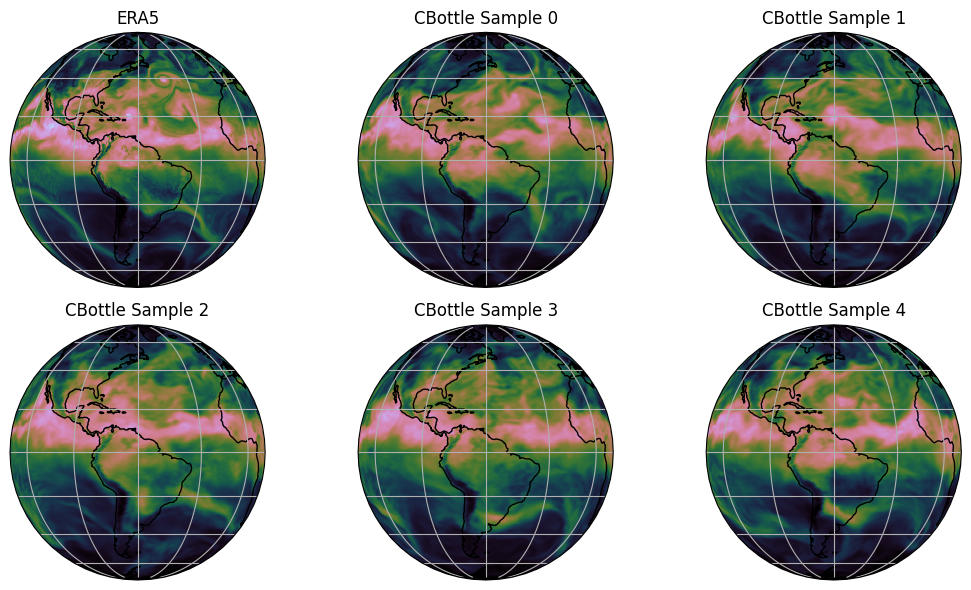

In [4]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

variable = "tcwv"

plt.close("all")
projection = ccrs.Orthographic(central_longitude=300.0)

# Create a figure and axes with the specified projection
fig, ax = plt.subplots(2, 3, subplot_kw={"projection": projection}, figsize=(11, 6))
ax = ax.flatten()

ax[0].pcolormesh(
    era5_da.coords["lon"],
    era5_da.coords["lat"],
    era5_da.sel(variable=variable).isel(time=0),
    transform=ccrs.PlateCarree(),
    cmap="cubehelix",
)
ax[0].set_title("ERA5")

for i in range(n_samples):
    ax[i + 1].pcolormesh(
        cbottle_da.coords["lon"],
        cbottle_da.coords["lat"],
        cbottle_da.sel(variable=variable).isel(time=i),
        transform=ccrs.PlateCarree(),
        cmap="cubehelix",
        vmin=0,
        vmax=90,
    )
    ax[i + 1].set_title(f"CBottle Sample {i}")

for ax0 in ax:
    ax0.coastlines()
    ax0.gridlines()

plt.tight_layout()
plt.savefig("outputs/12_tcwv_cbottle_datasource.jpg")

In [5]:
import numpy as np

from earth2studio.data.utils import fetch_data

# Input variables
input_variables = ["u10m", "v10m"]

# Load the default model package which downloads the check point from NGC
package = CBottleInfill.load_default_package()
model = CBottleInfill.load_model(package, input_variables=input_variables)
model = model.to(device)

model.set_seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)

times = np.array([timestamp] * n_samples, dtype="datetime64[ns]")
x, coords = fetch_data(era5_ds, times, input_variables, device=device)
output_0, output_coords = model(x, coords)
print(output_0.shape)

Fetching WB2 data:   0%|          | 0/10 [00:00<?, ?it/s]

2025-11-02 22:19:40.573 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: u10m at 2022-09-05T00:00:00
2025-11-02 22:19:40.578 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: u10m at 2022-09-05T00:00:00
2025-11-02 22:19:40.583 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: v10m at 2022-09-05T00:00:00
2025-11-02 22:19:40.589 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: v10m at 2022-09-05T00:00:00
2025-11-02 22:19:40.594 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: u10m at 2022-09-05T00:00:00
2025-11-02 22:19:40.599 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: v10m at 2022-09-05T00:00:00
2025-11-02 22:19:40.606 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: u10m at 2022-09-05T00:00:00

Fetching WB2 data: 100%|██████████| 10/10 [00:00<00:00, 20.72it/s]


torch.Size([5, 1, 45, 721, 1440])


In [6]:
input_variables = [
    "u10m",
    "v10m",
    "t2m",
    "msl",
    "z50",
    "u50",
    "v50",
    "z500",
    "u500",
    "v500",
    "z1000",
    "u1000",
    "v1000",
]

# Load the default model package which downloads the check point from NGC
package = CBottleInfill.load_default_package()
model = CBottleInfill.load_model(package, input_variables=input_variables)
model = model.to(device)

model.set_seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)

x, coords = fetch_data(era5_ds, times, input_variables, device=device)
output_1, output_coords = model(x, coords)
print(output_1.shape)

Fetching WB2 data:   0%|          | 0/65 [00:00<?, ?it/s]

2025-11-02 22:22:48.095 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: v500 at 2022-09-05T00:00:00
2025-11-02 22:22:48.100 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: z50 at 2022-09-05T00:00:00
2025-11-02 22:22:48.104 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: z1000 at 2022-09-05T00:00:00
2025-11-02 22:22:48.109 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: z500 at 2022-09-05T00:00:00
2025-11-02 22:22:48.112 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: u500 at 2022-09-05T00:00:00
2025-11-02 22:22:48.117 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: v50 at 2022-09-05T00:00:00
2025-11-02 22:22:48.120 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: z1000 at 2022-09-05T00:00:00

Fetching WB2 data:   2%|▏         | 1/65 [00:00<00:30,  2.09it/s]

2025-11-02 22:22:48.595 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/v_component_of_wind/93032.0.0.0 to local cache
2025-11-02 22:22:48.601 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/v_component_of_wind/93032.0.0.0 to local cache
2025-11-02 22:22:48.605 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/v_component_of_wind/93032.0.0.0 to local cache
2025-11-02 22:22:48.611 | DEBUG    | earth2studio.data.utils:_make_local_details:631 - Copying /weatherbench2/datasets/era5/1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr/v_component_of_wind/93032.0.0.0 to local cache
2025-11-02 22:22:48.616 | DEBUG    | earth2studio.data.utils:_make_local

Fetching WB2 data: 100%|██████████| 65/65 [00:30<00:00,  2.10it/s]


torch.Size([5, 1, 45, 721, 1440])


Fetching WB2 data: 100%|██████████| 1/1 [00:00<00:00, 32.19it/s]


2025-11-02 22:28:24.431 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: tcwv at 2022-09-05T00:00:00


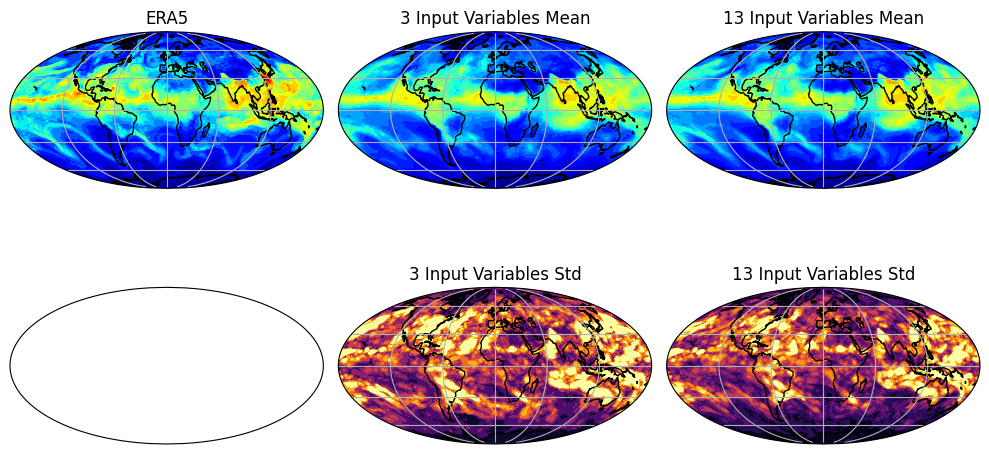

In [7]:
variable = "tcwv"
var_idx = np.where(output_coords["variable"] == "tcwv")[0][0]
era5_data, _ = fetch_data(era5_ds, times[:1], [variable], device=device)

plt.close("all")
projection = ccrs.Mollweide(central_longitude=0)

# Create a figure and axes with the specified projection
fig, ax = plt.subplots(2, 3, subplot_kw={"projection": projection}, figsize=(10, 6))


def plot_contour(
    ax0: plt.axes,
    data: torch.Tensor,
    cmap: str = "jet",
    vrange: tuple[int, int] = (0, 90),
) -> None:
    """Contour helper"""
    ax0.contourf(
        output_coords["lon"],
        output_coords["lat"],
        data.cpu(),
        vmin=vrange[0],
        vmax=vrange[1],
        transform=ccrs.PlateCarree(),
        levels=20,
        cmap=cmap,
    )
    ax0.coastlines()
    ax0.gridlines()


plot_contour(ax[0, 0], era5_data[0, 0, 0])
plot_contour(ax[0, 1], torch.mean(output_0[:, 0, var_idx], axis=0))
plot_contour(ax[0, 2], torch.mean(output_1[:, 0, var_idx], axis=0))
plot_contour(
    ax[1, 1], torch.std(output_0[:, 0, var_idx], axis=0), cmap="inferno", vrange=(0, 10)
)
plot_contour(
    ax[1, 2], torch.std(output_1[:, 0, var_idx], axis=0), cmap="inferno", vrange=(0, 10)
)

ax[0, 0].set_title("ERA5")
ax[0, 1].set_title("3 Input Variables Mean")
ax[0, 2].set_title("13 Input Variables Mean")
ax[1, 1].set_title("3 Input Variables Std")
ax[1, 2].set_title("13 Input Variables Std")

plt.tight_layout()
plt.savefig("outputs/12_tcwv_cbottle_infill.jpg")

# CBottle Super-resolution

In [4]:
import torch

# 0) Pick device and force it as the *default* for all newly created tensors
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    torch.set_default_device(device)  # <<< critical line

# 1) (Re)load everything *after* setting default device
from earth2studio.data import WB2ERA5, CBottle3D, fetch_data
from earth2studio.models.dx import CBottleInfill, CBottleSR

# Data sources / models — pass device into loaders when available
package = CBottle3D.load_default_package()
cbottle_ds = CBottle3D.load_model(package)           # ok; .to() next
cbottle_ds = cbottle_ds.to(device)

super_resolution_window = (0, -120, 50, -40)
package = CBottleSR.load_default_package()
cbottle_sr = CBottleSR.load_model(
    package,
    output_resolution=(1024, 1024),
    super_resolution_window=super_resolution_window,
    device=str(device),   # also pass device to the inner SR model
)
cbottle_sr = cbottle_sr.to(device)  # keeps everything consistent

import types
import torch

def _patched_reorder_to_sr_channels(self, x: torch.Tensor) -> torch.Tensor:
    # align x to the device of the index tensor, then index_select
    return torch.index_select(x.to(self._to_sr_index.device), 0, self._to_sr_index)

def _patched_reorder_from_sr_channels(self, x: torch.Tensor) -> torch.Tensor:
    # align x to the device of the index tensor, then index_select
    return torch.index_select(x.to(self._from_sr_index.device), 0, self._from_sr_index)

cbottle_sr._reorder_to_sr_channels   = types.MethodType(_patched_reorder_to_sr_channels, cbottle_sr)
cbottle_sr._reorder_from_sr_channels = types.MethodType(_patched_reorder_from_sr_channels, cbottle_sr)


input_variables = ["u10m", "v10m"]
package = CBottleInfill.load_default_package()
cbottle_infill = CBottleInfill.load_model(
    package, input_variables=input_variables, sampler_steps=18
)
cbottle_infill = cbottle_infill.to(device)

era5_ds = WB2ERA5()

# 2) Fetch and map coords
from earth2studio.utils.coords import map_coords
import numpy as np, datetime

times = np.array([datetime.datetime(2020, 1, 1)], dtype="datetime64[ns]")
synth_x, synth_coords = fetch_data(
    cbottle_ds,
    times,
    cbottle_sr.input_coords()["variable"],
    device=device,
)

synth_x, synth_coords = map_coords(synth_x, synth_coords, cbottle_sr.input_coords())

# 3) Ensure everything you pass in is on the same device & with correct dtypes
def _to_device_and_fix_dtype(coords, device):
    out = {}
    for k, v in coords.items():
        if torch.is_tensor(v):
            v = v.to(device)
            if not torch.is_floating_point(v) and v.dtype != torch.long:
                v = v.long()
        out[k] = v
    return out

synth_x = synth_x.to(device)
synth_coords = _to_device_and_fix_dtype(synth_coords, device)

# 4) Call SR
sr_synth_x, sr_synth_coords = cbottle_sr(synth_x, synth_coords)

Generating cBottle Data: 100%|██████████| 1/1 [00:09<00:00,  9.02s/it]


In [7]:
# --- ERA5 → Infill → Super-Resolution (GPU-safe) ---

import torch
from collections import OrderedDict
from earth2studio.utils.coords import map_coords

def move_coords(coords, device):
    """Move coord tensors to `device` while preserving OrderedDict + dtypes."""
    out = OrderedDict()
    for k, v in coords.items():
        if torch.is_tensor(v):
            v = v.to(device)
            if not torch.is_floating_point(v) and v.dtype != torch.long:
                v = v.long()
        out[k] = v
    return out

# A) Get the ERA5 data (only u10m and v10m available)
era5_x, era5_coords = fetch_data(
    era5_ds,
    times,
    input_variables,   # e.g. ["u10m", "v10m"]
    device=device,
)
era5_x = era5_x.to(device)
era5_coords = move_coords(era5_coords, device)

# B) Perform infilling to get all required variables (ensure CUDA RNG)
cbottle_infill = cbottle_infill.to(device)
cbottle_infill.rng = torch.Generator(device=device).manual_seed(0)  # set/keep your seed
infill_x, infill_coords = cbottle_infill(era5_x, era5_coords)

# C) Select the required variables and reshape for super resolution
infill_x, infill_coords = map_coords(infill_x, infill_coords, cbottle_sr.input_coords())

# D) Make absolutely sure tensors/coords match the SR model device
infill_x = infill_x.to(device)
infill_coords = move_coords(infill_coords, device)

# E) Super resolution
sr_infill_x, sr_infill_coords = cbottle_sr(infill_x, infill_coords)

Fetching WB2 data: 100%|██████████| 2/2 [00:00<00:00, 75.58it/s]


2025-11-03 00:49:14.947 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: u10m at 2020-01-01T00:00:00
2025-11-03 00:49:14.949 | DEBUG    | earth2studio.data.wb2:fetch_array:241 - Fetching WB2 zarr array for variable: v10m at 2020-01-01T00:00:00


/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


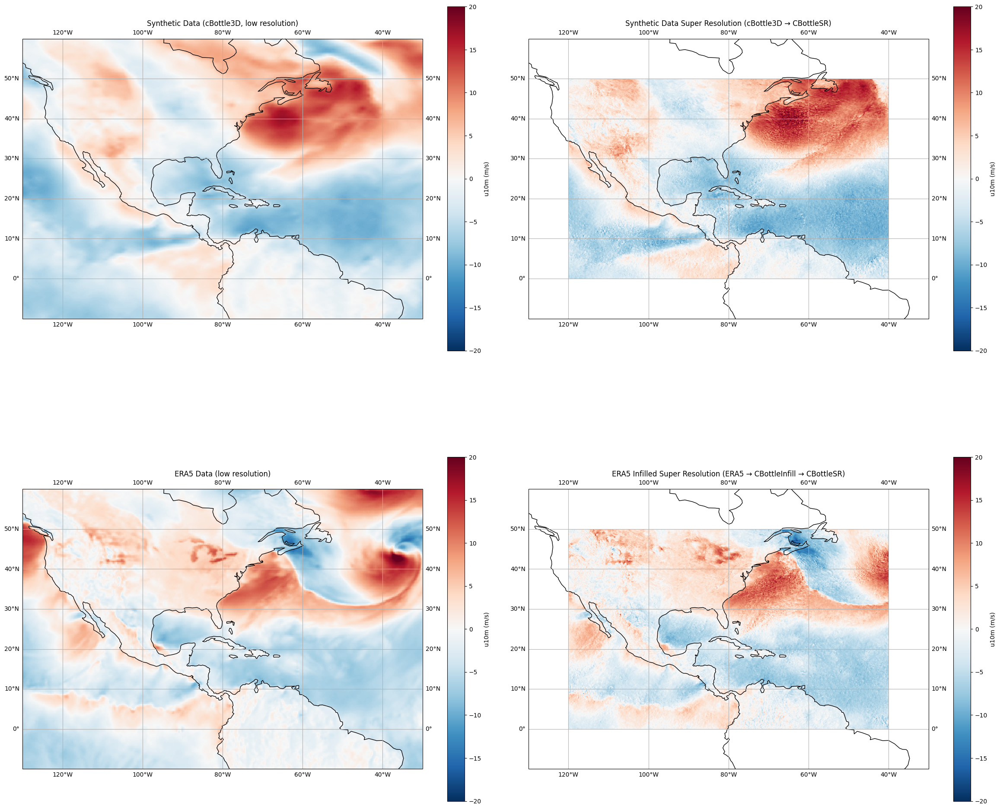

In [8]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

plt.close("all")

# Create projection focused on a region of interest (North Atlantic/Europe)
projection = ccrs.PlateCarree()
fig = plt.figure(figsize=(24, 24))

# Plot synthetic data
ax0 = fig.add_subplot(2, 2, 1, projection=projection)
extent = [
    super_resolution_window[1] - 10,
    super_resolution_window[3] + 10,
    super_resolution_window[0] - 10,
    super_resolution_window[2] + 10,
]
ax0.set_extent(extent, crs=ccrs.PlateCarree())
c = ax0.pcolormesh(
    synth_coords["lon"],
    synth_coords["lat"],
    synth_x[0, 0, 3, :, :].cpu().numpy(),  # u10m (variable index 3)
    transform=ccrs.PlateCarree(),
    cmap="RdBu_r",
    vmin=-20,
    vmax=20,
)
plt.colorbar(c, ax=ax0, shrink=0.6, label="u10m (m/s)")
ax0.coastlines()
ax0.gridlines(draw_labels=True)
ax0.set_title("Synthetic Data (cBottle3D, low resolution)")

# Plot the synthetic super resolution data
ax1 = fig.add_subplot(2, 2, 2, projection=projection)
ax1.set_extent(extent, crs=ccrs.PlateCarree())
c = ax1.pcolormesh(
    sr_synth_coords["lon"],
    sr_synth_coords["lat"],
    sr_synth_x[0, 0, 3, :, :].cpu().numpy(),  # u10m (variable index 3)
    transform=ccrs.PlateCarree(),
    cmap="RdBu_r",
    vmin=-20,
    vmax=20,
)
plt.colorbar(c, ax=ax1, shrink=0.6, label="u10m (m/s)")
ax1.coastlines()
ax1.gridlines(draw_labels=True)
ax1.set_title("Synthetic Data Super Resolution (cBottle3D → CBottleSR)")

# Plot the ERA5 data
ax2 = fig.add_subplot(2, 2, 3, projection=projection)
ax2.set_extent(extent, crs=ccrs.PlateCarree())
c = ax2.pcolormesh(
    era5_coords["lon"],
    era5_coords["lat"],
    era5_x[0, 0, 0, :, :].cpu().numpy(),  # u10m (variable index 0)
    transform=ccrs.PlateCarree(),
    cmap="RdBu_r",
    vmin=-20,
    vmax=20,
)
plt.colorbar(c, ax=ax2, shrink=0.6, label="u10m (m/s)")
ax2.coastlines()
ax2.gridlines(draw_labels=True)
ax2.set_title("ERA5 Data (low resolution)")

# Plot the ERA5 infilled super resolution data
ax3 = fig.add_subplot(2, 2, 4, projection=projection)
ax3.set_extent(extent, crs=ccrs.PlateCarree())
c = ax3.pcolormesh(
    sr_infill_coords["lon"],
    sr_infill_coords["lat"],
    sr_infill_x[0, 0, 3, :, :].cpu().numpy(),  # u10m (variable index 3)
    transform=ccrs.PlateCarree(),
    cmap="RdBu_r",
    vmin=-20,
    vmax=20,
)
plt.colorbar(c, ax=ax3, shrink=0.6, label="u10m (m/s)")
ax3.coastlines()
ax3.gridlines(draw_labels=True)
ax3.set_title("ERA5 Infilled Super Resolution (ERA5 → CBottleInfill → CBottleSR)")

plt.tight_layout()
plt.savefig("outputs/16_cbottle_super_resolution.jpg", dpi=150, bbox_inches="tight")

# Wind Gust - Nov 8, 2025

In [1]:
import torch, platform, sys, subprocess, os
print("Python:", sys.version)
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    a = torch.randn(1, device="cuda")  # quick sanity
    print("CUDA test OK")

Python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
PyTorch: 2.8.0+cu126
CUDA available: True
GPU: NVIDIA A100-SXM4-80GB
CUDA test OK


In [4]:
# Make fsspec + cloud filesystems consistent and satisfy IPython's jedi need
!pip -q install "fsspec[http]==2025.10.0" "s3fs==2025.10.0" "gcsfs==2025.10.0" jedi -U datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 56.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 25.6.0 requires pyarrow<20.0.0a0,>=14.0.0; platform_machine == "x86_64", but you have pyarrow 22.0.0 which is incompatible.
pylibcudf-cu12 25.6.0 requires pyarrow<20.0.0a0,>=14.0.0; platform_machine == "x86_64", but you have pyarrow 22.0.0 which is incompatible.


In [5]:
# Earth2Studio with the windgust diagnostic extra deps (physicsnemo, etc.)
!pip -q install "earth2studio @ git+https://github.com/NVIDIA/earth2studio.git@0.9.0"
!pip -q install 'earth2studio[windgust-afno] @ git+https://github.com/NVIDIA/earth2studio.git@0.9.0'

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [6]:
import torch, numpy as np
from earth2studio.models.dx.wind_gust import WindgustAFNO

device = "cuda" if torch.cuda.is_available() else "cpu"
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

pkg = WindgustAFNO.load_default_package()
wg = WindgustAFNO.load_model(pkg).to(device).eval()

lat = np.linspace(90, -90, 720, endpoint=False)
lon = np.linspace(0, 360, 1440, endpoint=False)
VARS = ["u100m","v100m","msl","u300","u850","u925",
        "v300","v850","v925","z300","z850","z925",
        "t850","t925","q500","q850","q925"]

coords = {
    "batch": np.arange(1),
    "time": np.array([np.datetime64("2024-07-01T00:00:00Z")]),
    "lead_time": np.array([np.timedelta64(0,"h")]),
    "variable": np.array(VARS),
    "lat": lat, "lon": lon,
}
x = torch.randn(1,1,1,len(VARS),720,1440, device=device, dtype=torch.float32)

with torch.inference_mode():
    y, out_coords = wg(x, coords)

print("Output shape:", tuple(y.shape), "| var:", out_coords["variable"])

GPU: NVIDIA A100-SXM4-80GB


Output shape: (1, 1, 1, 1, 720, 1440) | var: ['fg10m']


# Wind Gust on ARCO ERA5

In [7]:
!pip -q install zarr==2.14.2 numcodecs==0.11.0

import xarray as xr

# Analysis-ready (regular 0.25° lat-lon) dataset.
# This path is widely referenced by ARCO users; if it 404s in your region, run:
#   !gsutil ls gs://gcp-public-data-arco-era5/ar/
# to discover the exact store names available.
ds = xr.open_zarr(
    "gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3",
    chunks={"time": 24},  # 1 day at a time
    storage_options={"token": "anon"},
    consolidated=True,
)

ds

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 16.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 kB 19.4 MB/s eta 0:00:00


<xarray.Dataset> Size: 4PB
Dimensions:                                                          (
                                                                      time: 1323648,
                                                                      latitude: 721,
                                                                      longitude: 1440,
                                                                      level: 37)
Coordinates:
  * time                                                             (time) datetime64[ns] 11MB ...
  * latitude                                                         (latitude) float32 3kB ...
  * longitude                                                        (longitude) float32 6kB ...
  * level                                                            (level) int64 296B ...
Data variables: (12/273)
    100m_u_component_of_wind                                         (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    100m_v_component_of_wind                                         (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_u_component_of_neutral_wind                                  (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_u_component_of_wind                                          (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_v_component_of_neutral_wind                                  (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_v_component_of_wind                                          (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    ...                                                               ...
    wave_spectral_directional_width_for_swell                        (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_directional_width_for_wind_waves                   (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_kurtosis                                           (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_peakedness                                         (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_skewness                                           (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    zero_degree_level                                                (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
Attributes:
    last_updated:           2025-11-08 02:07:21.520708+00:00
    valid_time_start:       1940-01-01
    valid_time_stop:        2025-04-30
    valid_time_stop_era5t:  2025-11-02

In [8]:
import numpy as np

# Pick a tiny time window (e.g., 2020-01-01 00:00 through 2020-01-01 03:00)
ds_t = ds.sel(time=slice("2020-01-01T00:00:00", "2020-01-01T03:00:00"))
ds_t


<xarray.Dataset> Size: 11GB
Dimensions:                                                          (time: 4,
                                                                      latitude: 721,
                                                                      longitude: 1440,
                                                                      level: 37)
Coordinates:
  * time                                                             (time) datetime64[ns] 32B ...
  * latitude                                                         (latitude) float32 3kB ...
  * longitude                                                        (longitude) float32 6kB ...
  * level                                                            (level) int64 296B ...
Data variables: (12/273)
    100m_u_component_of_wind                                         (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    100m_v_component_of_wind                                         (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    10m_u_component_of_neutral_wind                                  (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    10m_u_component_of_wind                                          (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    10m_v_component_of_neutral_wind                                  (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    10m_v_component_of_wind                                          (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    ...                                                               ...
    wave_spectral_directional_width_for_swell                        (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    wave_spectral_directional_width_for_wind_waves                   (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    wave_spectral_kurtosis                                           (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    wave_spectral_peakedness                                         (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    wave_spectral_skewness                                           (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    zero_degree_level                                                (time, latitude, longitude) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
Attributes:
    last_updated:           2025-11-08 02:07:21.520708+00:00
    valid_time_start:       1940-01-01
    valid_time_stop:        2025-04-30
    valid_time_stop_era5t:  2025-11-02

In [10]:
import numpy as np
import xarray as xr

# If your opened dataset uses 'latitude'/'longitude', rename to 'lat'/'lon' for consistency.
if "latitude" in ds_t.coords and "longitude" in ds_t.coords:
    ds_t = ds_t.rename({"latitude":"lat", "longitude":"lon"})

# Helper: select a pressure level (in hPa) from a base var and rename to the model's expected name
def atlev(ds, base_var, lev, new_name):
    return ds[base_var].sel(level=lev).rename(new_name)

# --- Surface / single-level fields ---
u100m = ds_t["100m_u_component_of_wind"].rename("u100m")
v100m = ds_t["100m_v_component_of_wind"].rename("v100m")
msl   = ds_t["mean_sea_level_pressure"].rename("msl")  # Pa

# --- Pressure-level fields (level coordinate is in hPa) ---
u300 = atlev(ds_t, "u_component_of_wind", 300, "u300")
u850 = atlev(ds_t, "u_component_of_wind", 850, "u850")
u925 = atlev(ds_t, "u_component_of_wind", 925, "u925")

v300 = atlev(ds_t, "v_component_of_wind", 300, "v300")
v850 = atlev(ds_t, "v_component_of_wind", 850, "v850")
v925 = atlev(ds_t, "v_component_of_wind", 925, "v925")

z300 = atlev(ds_t, "geopotential", 300, "z300")      # already m^2 s^-2 (geopotential)
z850 = atlev(ds_t, "geopotential", 850, "z850")
z925 = atlev(ds_t, "geopotential", 925, "z925")

t850 = atlev(ds_t, "temperature", 850, "t850")       # K
t925 = atlev(ds_t, "temperature", 925, "t925")

q500 = atlev(ds_t, "specific_humidity", 500, "q500") # kg/kg
q850 = atlev(ds_t, "specific_humidity", 850, "q850")
q925 = atlev(ds_t, "specific_humidity", 925, "q925")

# Merge into one Dataset
ds_inputs = xr.merge(
    [u100m, v100m, msl,
     u300, u850, u925,
     v300, v850, v925,
     z300, z850, z925,
     t850, t925,
     q500, q850, q925],
    compat="override"
)

# Ensure lon is 0..360, sorted; lat descending 90→-90 (ARCO AR is usually fine already)
ds_inputs = ds_inputs.assign_coords(lon=(ds_inputs.lon % 360)).sortby("lon")
if ds_inputs.lat[0] < ds_inputs.lat[-1]:
    ds_inputs = ds_inputs.sortby("lat", ascending=False)

ds_inputs

<xarray.Dataset> Size: 282MB
Dimensions:  (lat: 721, time: 4, lon: 1440)
Coordinates:
  * lat      (lat) float32 3kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time     (time) datetime64[ns] 32B 2020-01-01 ... 2020-01-01T03:00:00
  * lon      (lon) float32 6kB 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8
    level    int64 8B 300
Data variables: (12/17)
    u100m    (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    v100m    (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    msl      (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    u300     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    u850     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    u925     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    ...       ...
    z925     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    t850     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    t925     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q500     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q850     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q925     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
Attributes:
    long_name:   100 metre U wind component
    short_name:  u100
    units:       m s**-1

In [12]:
import numpy as np
import xarray as xr

# 1) Ensure standard coord names
if "latitude" in ds_inputs.coords and "longitude" in ds_inputs.coords:
    ds_inputs = ds_inputs.rename({"latitude":"lat", "longitude":"lon"})

# 2) Sort & normalize longitudes to [0,360)
ds_inputs = ds_inputs.assign_coords(lon=(ds_inputs.lon % 360)).sortby("lon")
# Make sure latitude is descending
if ds_inputs.lat[0] < ds_inputs.lat[-1]:
    ds_inputs = ds_inputs.sortby("lat", ascending=False)

# 3) Drop the south pole if present (ARCO AR is often 721 lats incl. -90°)
if ds_inputs.sizes["lat"] == 721:
    # ARCO AR is typically 90.00, 89.75, ..., -89.75, -90.00
    # We need to exclude -90.00
    ds_inputs = ds_inputs.isel(lat=slice(0, 720))

# 4) Verify sizes now match model expectations
assert ds_inputs.sizes["lat"] == 720, f"lat size must be 720; got {ds_inputs.sizes['lat']}"
assert ds_inputs.sizes["lon"] == 1440, f"lon size must be 1440; got {ds_inputs.sizes['lon']}"

# 5) Assign the exact coordinates the model uses (avoids float round-off mismatches)
target_lat = np.linspace(90, -90, 720, endpoint=False)
target_lon = np.linspace(0, 360, 1440, endpoint=False)
ds_inputs = ds_inputs.assign_coords(lat=("lat", target_lat),
                                    lon=("lon", target_lon))

In [13]:
VARS = ["u100m","v100m","msl",
        "u300","u850","u925",
        "v300","v850","v925",
        "z300","z850","z925",
        "t850","t925",
        "q500","q850","q925"]

stacked = xr.concat([ds_inputs[v] for v in VARS], dim="variable") \
            .assign_coords(variable=("variable", VARS)) \
            .transpose("time","variable","lat","lon")

time_sel = stacked.time.values[:1]
lead_sel = np.array([np.timedelta64(0,"h")])

arr = stacked.sel(time=time_sel).astype("float32").values  # [T,V,Lat,Lon]
x = torch.from_numpy(arr[None, :, None, :, :, :]).to("cuda")

coords = {
    "batch": np.arange(1),
    "time": time_sel,
    "lead_time": lead_sel,
    "variable": np.array(VARS),
    "lat": stacked.lat.values,   # now exactly the model’s lat
    "lon": stacked.lon.values,   # now exactly the model’s lon
}

with torch.inference_mode():
    y, out_coords = wg(x, coords)

print(tuple(y.shape), out_coords["variable"])

(1, 1, 1, 1, 720, 1440) ['fg10m']


In [14]:
import numpy as np
import xarray as xr
import torch

# y: torch tensor with shape [B, T, L, 1, 720, 1440]
# coords: the dict you passed into the model

# Compute valid_time = time + lead_time (shape [T, L])
valid_time = (
    np.asarray(coords["time"])[:, None] + np.asarray(coords["lead_time"])[None, :]
)

# Squeeze the singleton 'variable' dim and move to CPU/np
fg_np = y.squeeze(3).detach().cpu().numpy()  # -> [B, T, L, 720, 1440]

ds_out = xr.Dataset(
    data_vars=dict(
        fg10m=(("batch", "time", "lead_time", "lat", "lon"), fg_np,
               {"units": "m s-1",
                "long_name": "10 m wind gust (1h maximum)",
                "description": "AFNO diagnostic: max gust in the preceding hour"})
    ),
    coords=dict(
        batch=coords["batch"],
        time=coords["time"],
        lead_time=coords["lead_time"],
        valid_time=(("time", "lead_time"), valid_time),
        lat=coords["lat"],
        lon=coords["lon"],
    ),
    attrs=dict(
        model="Windgust AFNO",
        grid="0.25° regular, lat=90→-90 (south pole excluded), lon=0..360",
        note="fg10m at valid_time is the max gust over the preceding hour",
    ),
)

ds_out

<xarray.Dataset> Size: 4MB
Dimensions:     (batch: 1, time: 1, lead_time: 1, lat: 720, lon: 1440)
Coordinates:
  * batch       (batch) int64 8B 0
  * time        (time) datetime64[ns] 8B 2020-01-01
  * lead_time   (lead_time) timedelta64[s] 8B 00:00:00
  * lat         (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon         (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    valid_time  (time, lead_time) datetime64[ns] 8B 2020-01-01
Data variables:
    fg10m       (batch, time, lead_time, lat, lon) float32 4MB 8.749 ... 7.288
Attributes:
    model:    Windgust AFNO
    grid:     0.25° regular, lat=90→-90 (south pole excluded), lon=0..360
    note:     fg10m at valid_time is the max gust over the preceding hour

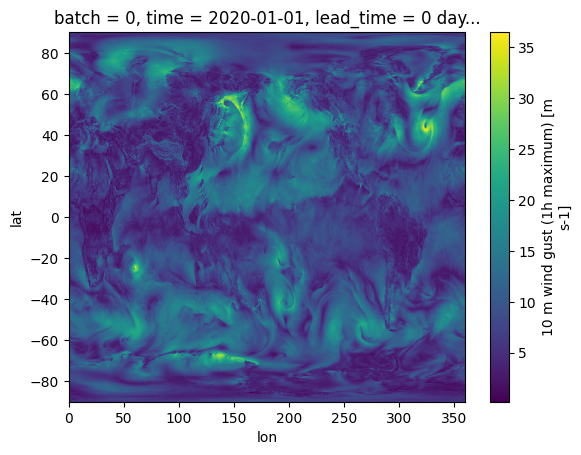

In [17]:
ds_out.fg10m.plot()

# What was the corresponding input

In [19]:
VARS = ["u100m","v100m","msl",
        "u300","u850","u925",
        "v300","v850","v925",
        "z300","z850","z925",
        "t850","t925",
        "q500","q850","q925"]

# Slice to the same times you used for the run (time_sel)
inputs_slice = stacked.sel(time=ds_out.time.values)

# Convert back from the stacked var-dimension into separate variables
inputs_ds = xr.Dataset(
    {v: inputs_slice.sel(variable=v).drop_vars("variable") for v in VARS}
).transpose("time", "lat", "lon")

# (Optional) add helpful attrs
for v in VARS:
    if v.startswith(("u","v")) and v.endswith(("m","00","50","25")) is False:
        inputs_ds[v].attrs["units"] = "m s-1"
    if v == "msl":
        inputs_ds[v].attrs["units"] = "Pa"
    if v.startswith("t"):
        inputs_ds[v].attrs["units"] = "K"
    if v.startswith("q"):
        inputs_ds[v].attrs["units"] = "kg kg-1"
    if v.startswith("z"):
        inputs_ds[v].attrs["units"] = "m^2 s-2"  # geopotential

inputs_ds.attrs["note"] = "Inputs assembled in the exact order Windgust AFNO expects"
inputs_ds

<xarray.Dataset> Size: 71MB
Dimensions:  (time: 1, lat: 720, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 8B 2020-01-01
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    level    int64 8B 300
Data variables: (12/17)
    u100m    (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    v100m    (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    msl      (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    u300     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    u850     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    u925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    ...       ...
    z925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    t850     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    t925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    q500     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    q850     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    q925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
Attributes:
    note:     Inputs assembled in the exact order Windgust AFNO expects

In [21]:
inputs_ds

<xarray.Dataset> Size: 71MB
Dimensions:  (time: 1, lat: 720, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 8B 2020-01-01
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    level    int64 8B 300
Data variables: (12/17)
    u100m    (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    v100m    (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    msl      (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    u300     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    u850     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    u925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    ...       ...
    z925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    t850     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    t925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    q500     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    q850     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    q925     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
Attributes:
    note:     Inputs assembled in the exact order Windgust AFNO expects

# Compare with how 10m wind speed in ARCO ERA5 which is instantaneous is

In [22]:
import xarray as xr
import numpy as np

# ds_t is your ARCO AR slice (e.g., time window you used to build ds_inputs)
# If needed, rename coords to lat/lon (same as before)
if "latitude" in ds_t.coords and "longitude" in ds_t.coords:
    ds_t = ds_t.rename({"latitude":"lat", "longitude":"lon"})

# Grab instantaneous 10 m winds at the **same times** you used for the model run
u10 = ds_t["10m_u_component_of_wind"].sel(time=ds_out.time.values).rename("u10")
v10 = ds_t["10m_v_component_of_wind"].sel(time=ds_out.time.values).rename("v10")

# Normalize longitudes to 0..360, sort; ensure lat is descending
uv10 = xr.merge([u10, v10])
uv10 = uv10.assign_coords(lon=(uv10.lon % 360)).sortby("lon")
if uv10.lat[0] < uv10.lat[-1]:
    uv10 = uv10.sortby("lat", ascending=False)

# ARCO AR often has 721 lats (includes -90). Drop south pole to match the model’s 720.
if uv10.sizes["lat"] == 721:
    uv10 = uv10.isel(lat=slice(0, 720))

# Assign the **exact** model coordinate arrays to avoid tiny float mismatches
target_lat = np.linspace(90, -90, 720, endpoint=False)
target_lon = np.linspace(0, 360, 1440, endpoint=False)
uv10 = uv10.assign_coords(lat=("lat", target_lat), lon=("lon", target_lon))

uv10

<xarray.Dataset> Size: 8MB
Dimensions:  (time: 1, lat: 720, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 8B 2020-01-01
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    u10      (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    v10      (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
Attributes:
    long_name:   10 metre U wind component
    short_name:  u10
    units:       m s**-1

In [23]:
ws10 = (uv10.u10**2 + uv10.v10**2) ** 0.5
ws10 = ws10.rename("ws10")
ws10.attrs.update(units="m s-1", long_name="10 m wind speed (instantaneous)")
ds_ws10 = ws10.to_dataset()
ds_ws10

<xarray.Dataset> Size: 4MB
Dimensions:  (time: 1, lat: 720, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 8B 2020-01-01
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    ws10     (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>

In [24]:
# Select gust at lead_time=0 and drop batch if present
fg = ds_out["fg10m"].isel(lead_time=0)
if "batch" in fg.dims:
    fg = fg.isel(batch=0, drop=True)
fg = fg.rename("fg10m")
fg.attrs.update(units="m s-1", long_name="10 m wind gust (1h max)")

# Align datasets (they should already match by time/lat/lon now)
fg, ds_ws10 = xr.align(fg, ds_ws10, join="exact")

# Build a tidy comparison dataset
compare = xr.Dataset(
    dict(
        fg10m=fg,
        ws10=ds_ws10.ws10,
        gust_minus_speed=(fg - ds_ws10.ws10),
        gust_over_speed=(fg / ds_ws10.ws10.where(ds_ws10.ws10>0))  # avoid /0
    )
)
compare["gust_minus_speed"].attrs.update(units="m s-1", long_name="gust - sustained 10 m speed")
compare["gust_over_speed"].attrs.update(long_name="gust / sustained 10 m speed (unitless)")
compare

<xarray.Dataset> Size: 17MB
Dimensions:           (time: 1, lat: 720, lon: 1440)
Coordinates:
  * time              (time) datetime64[ns] 8B 2020-01-01
  * lat               (lat) float64 6kB 90.0 89.75 89.5 ... -89.25 -89.5 -89.75
  * lon               (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    lead_time         timedelta64[s] 8B 00:00:00
    valid_time        (time) datetime64[ns] 8B 2020-01-01
Data variables:
    fg10m             (time, lat, lon) float32 4MB 8.749 8.576 ... 7.594 7.288
    ws10              (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    gust_minus_speed  (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    gust_over_speed   (time, lat, lon) float32 4MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>

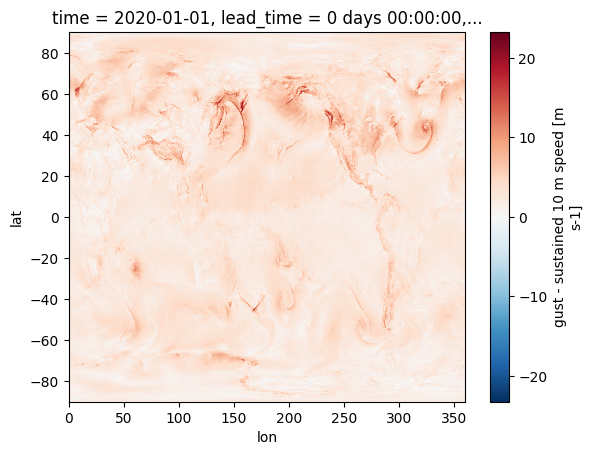

In [25]:
compare.gust_minus_speed.plot()

# 1 m/s is 2.238 mph so 20 m/s is ~45 mph difference

# Solar Radiation AFNO - Nov 8, 2025

In [1]:
# Core lib + Solar Radiation AFNO extras (physicsnemo, model code)
!pip -q install "earth2studio @ git+https://github.com/NVIDIA/earth2studio.git@0.9.0"
!pip -q install 'earth2studio[solarradiation-afno] @ git+https://github.com/NVIDIA/earth2studio.git@0.9.0'
# IO helpers (ARCO ERA5 Zarr)
!pip -q install zarr==2.14.2 numcodecs==0.11.0

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 145.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 149.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.0/201.0 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.4/276.4 kB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 96.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 142.2 MB/s eta 0:00:

In [2]:
import os, pathlib
cache = pathlib.Path("/root/.cache/earth2studio"); cache.mkdir(parents=True, exist_ok=True)
os.environ["EARTH2STUDIO_CACHE"] = str(cache)
os.environ["EARTH2STUDIO_PACKAGE_TIMEOUT"] = "900"

In [3]:
import numpy as np, torch
from earth2studio.models.dx.solarradiation_afno import SolarRadiationAFNO1H # or SolarRadiationAFNO6H

device = "cuda" if torch.cuda.is_available() else "cpu"

VARS = ["t2m","sp","tcwv",
        "z50","z300","z500","z700","z850","z925","z1000",
        "t50","t300","t500","t700","t850","t925","t1000",
        "q50","q300","q500","q700","q850","q925","q1000"]

lat = np.linspace(90, -90, 721)                  # include south pole
lon = np.linspace(0, 360, 1440, endpoint=False)

coords = {
    "batch": np.arange(1),
    "time": np.array([np.datetime64("2020-01-01T12:00:00Z")]),
    "lead_time": np.array([np.timedelta64(0,"h")]),
    "variable": np.array(VARS),
    "lat": lat, "lon": lon,
}

# Random but correctly-shaped input: [B,T,L,V,Lat,Lon] = [1,1,1,24,721,1440]
x = torch.randn(1,1,1,len(VARS),721,1440, dtype=torch.float32, device=device)

pkg = SolarRadiationAFNO1H.load_default_package()
sr  = SolarRadiationAFNO1H.load_model(pkg).to(device).eval()

with torch.inference_mode():
    y, out_coords = sr(x, coords)

print("Output:", y.shape, out_coords["variable"])  # (1,1,1,1,721,1440) ['ssrd']

Output: torch.Size([1, 1, 1, 1, 721, 1440]) ['ssrd']


# Run with Solar Radiation AFNO

In [4]:
import xarray as xr

# Open ARCO ERA5 AR (analysis-ready) store.
# If this exact key is unavailable in your region, list the bucket to find the equivalent.
ds = xr.open_zarr(
    "gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3",
    chunks={"time": 24},  # 1 day per chunk
    storage_options={"token": "anon"},
    consolidated=True,
)
ds

<xarray.Dataset> Size: 4PB
Dimensions:                                                          (
                                                                      time: 1323648,
                                                                      latitude: 721,
                                                                      longitude: 1440,
                                                                      level: 37)
Coordinates:
  * time                                                             (time) datetime64[ns] 11MB ...
  * latitude                                                         (latitude) float32 3kB ...
  * longitude                                                        (longitude) float32 6kB ...
  * level                                                            (level) int64 296B ...
Data variables: (12/273)
    100m_u_component_of_wind                                         (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    100m_v_component_of_wind                                         (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_u_component_of_neutral_wind                                  (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_u_component_of_wind                                          (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_v_component_of_neutral_wind                                  (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    10m_v_component_of_wind                                          (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    ...                                                               ...
    wave_spectral_directional_width_for_swell                        (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_directional_width_for_wind_waves                   (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_kurtosis                                           (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_peakedness                                         (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    wave_spectral_skewness                                           (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
    zero_degree_level                                                (time, latitude, longitude) float32 5TB dask.array<chunksize=(24, 721, 1440), meta=np.ndarray>
Attributes:
    valid_time_start:       1940-01-01
    last_updated:           2025-11-08 02:07:21.520708+00:00
    valid_time_stop:        2025-04-30
    valid_time_stop_era5t:  2025-11-02

In [5]:
ds_t = ds.sel(time=slice("2020-06-01T00:00:00","2020-06-01T03:00:00"))

In [6]:
import numpy as np

# Ensure standard coord names
if "latitude" in ds_t.coords and "longitude" in ds_t.coords:
    ds_t = ds_t.rename({"latitude":"lat", "longitude":"lon"})

# Helper: select a level and rename
def atlev(ds, base, lev, new):
    return ds[base].sel(level=lev).rename(new)

# Single-level
t2m  = ds_t["2m_temperature"].rename("t2m")
sp   = ds_t["surface_pressure"].rename("sp")
tcwv = ds_t["total_column_water_vapour"].rename("tcwv")

# Pressure-levels
z50   = atlev(ds_t, "geopotential", 50,   "z50")
z300  = atlev(ds_t, "geopotential", 300,  "z300")
z500  = atlev(ds_t, "geopotential", 500,  "z500")
z700  = atlev(ds_t, "geopotential", 700,  "z700")
z850  = atlev(ds_t, "geopotential", 850,  "z850")
z925  = atlev(ds_t, "geopotential", 925,  "z925")
z1000 = atlev(ds_t, "geopotential", 1000, "z1000")

t50   = atlev(ds_t, "temperature", 50,   "t50")
t300  = atlev(ds_t, "temperature", 300,  "t300")
t500  = atlev(ds_t, "temperature", 500,  "t500")
t700  = atlev(ds_t, "temperature", 700,  "t700")
t850  = atlev(ds_t, "temperature", 850,  "t850")
t925  = atlev(ds_t, "temperature", 925,  "t925")
t1000 = atlev(ds_t, "temperature", 1000, "t1000")

q50   = atlev(ds_t, "specific_humidity", 50,   "q50")
q300  = atlev(ds_t, "specific_humidity", 300,  "q300")
q500  = atlev(ds_t, "specific_humidity", 500,  "q500")
q700  = atlev(ds_t, "specific_humidity", 700,  "q700")
q850  = atlev(ds_t, "specific_humidity", 850,  "q850")
q925  = atlev(ds_t, "specific_humidity", 925,  "q925")
q1000 = atlev(ds_t, "specific_humidity", 1000, "q1000")

ds_inputs = xr.merge(
    [t2m, sp, tcwv,
     z50, z300, z500, z700, z850, z925, z1000,
     t50, t300, t500, t700, t850, t925, t1000,
     q50, q300, q500, q700, q850, q925, q1000],
    compat="override"
)

# Normalize coords: lon 0..360, lat descending
ds_inputs = ds_inputs.assign_coords(lon=(ds_inputs.lon % 360)).sortby("lon")
if ds_inputs.lat[0] < ds_inputs.lat[-1]:
    ds_inputs = ds_inputs.sortby("lat", ascending=False)

# For SSRD AFNO we KEEP the south pole: lat must be 721
if ds_inputs.sizes["lat"] == 720:
    # If somehow opened without the south pole, you need 721. (ARCO AR typically has 721.)
    raise RuntimeError("Expected 721 lat points (including -90°).")

# Assign exact model coords to avoid float mismatches
target_lat = np.linspace(90, -90, 721)                  # include -90°
target_lon = np.linspace(0, 360, 1440, endpoint=False)
ds_inputs = ds_inputs.assign_coords(lat=("lat", target_lat),
                                    lon=("lon", target_lon))

ds_inputs

<xarray.Dataset> Size: 399MB
Dimensions:  (time: 4, lat: 721, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 32B 2020-06-01 ... 2020-06-01T03:00:00
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    level    int64 8B 50
Data variables: (12/24)
    t2m      (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    sp       (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    tcwv     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    z50      (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    z300     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    z500     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    ...       ...
    q300     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q500     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q700     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q850     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q925     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q1000    (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
Attributes:
    long_name:   2 metre temperature
    short_name:  t2m
    units:       K

In [7]:
from earth2studio.models.dx.solarradiation_afno import SolarRadiationAFNO1H
import torch

VARS = ["t2m","sp","tcwv",
        "z50","z300","z500","z700","z850","z925","z1000",
        "t50","t300","t500","t700","t850","t925","t1000",
        "q50","q300","q500","q700","q850","q925","q1000"]

stacked = xr.concat([ds_inputs[v] for v in VARS], dim="variable") \
            .assign_coords(variable=("variable", VARS)) \
            .transpose("time","variable","lat","lon")

# Choose times / lead_times (lead_time matters because SZA is computed at time+lead_time)
time_sel = stacked.time.values[:1]
lead_sel = np.array([np.timedelta64(0,"h")], dtype="timedelta64[h]")

arr = stacked.sel(time=time_sel).astype("float32").values          # [T,V,Lat,Lon]
x   = torch.from_numpy(arr[None, :, None, :, :, :]).to("cuda")     # [1,T,1,24,721,1440]

pkg = SolarRadiationAFNO1H.load_default_package()
sr  = SolarRadiationAFNO1H.load_model(pkg).to("cuda").eval()

with torch.inference_mode():
    y, out_coords = sr(x, {
        "batch": np.arange(1),
        "time": time_sel,
        "lead_time": lead_sel,
        "variable": np.array(VARS),
        "lat": target_lat,
        "lon": target_lon,
    })

print(y.shape, out_coords["variable"])  # (1,1,1,1,721,1440) ['ssrd']

torch.Size([1, 1, 1, 1, 721, 1440]) ['ssrd']


In [8]:
valid_time = (time_sel[:, None] + lead_sel[None, :])
fg = y.squeeze(3).detach().cpu().numpy()  # [B,T,L,Lat,Lon]

ds_out = xr.Dataset(
    data_vars=dict(
        ssrd=(("batch","time","lead_time","lat","lon"), fg,
              {"units":"J m-2", "long_name":"surface solar radiation downwards (accumulated over 1h)"})
    ),
    coords=dict(
        batch=[0], time=time_sel, lead_time=lead_sel,
        valid_time=(("time","lead_time"), valid_time),
        lat=target_lat, lon=target_lon
    ),
    attrs=dict(model="SolarRadiation AFNO (1h)", note="SSRD accumulated over the preceding hour")
)

ds_out.isel(batch=0).to_netcdf("ssrd_afno_1h.nc")
"Saved ssrd_afno_1h.nc"

'Saved ssrd_afno_1h.nc'

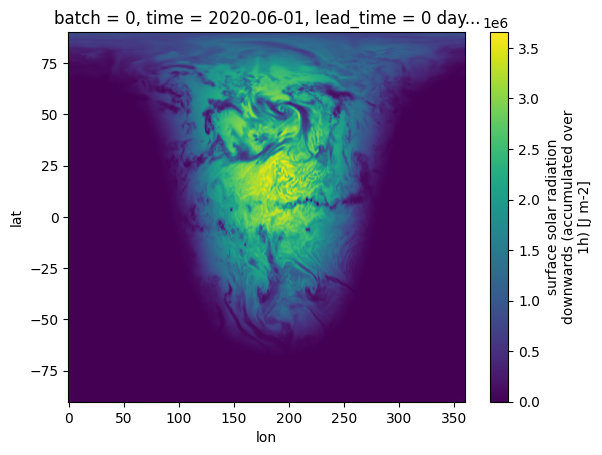

In [10]:
ds_out.ssrd.plot()

In [11]:
ds_inputs

<xarray.Dataset> Size: 399MB
Dimensions:  (time: 4, lat: 721, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 32B 2020-06-01 ... 2020-06-01T03:00:00
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    level    int64 8B 50
Data variables: (12/24)
    t2m      (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    sp       (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    tcwv     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    z50      (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    z300     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    z500     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    ...       ...
    q300     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q500     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q700     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q850     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q925     (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
    q1000    (time, lat, lon) float32 17MB dask.array<chunksize=(4, 721, 1440), meta=np.ndarray>
Attributes:
    long_name:   2 metre temperature
    short_name:  t2m
    units:       K

In [13]:
import numpy as np
import xarray as xr
import torch
from earth2studio.models.dx.solarradiation_afno import SolarRadiationAFNO1H

def run_ssrd_global(ds_inputs: xr.Dataset, times, lead_hours=(0,)):
    """
    Build global SSRD (1h) from ARCO-ERA5 inputs on the 0.25° grid.
    ds_inputs must contain these vars exactly:
      ["t2m","sp","tcwv",
       "z50","z300","z500","z700","z850","z925","z1000",
       "t50","t300","t500","t700","t850","t925","t1000",
       "q50","q300","q500","q700","q850","q925","q1000"]
    """
    VARS = ["t2m","sp","tcwv",
            "z50","z300","z500","z700","z850","z925","z1000",
            "t50","t300","t500","t700","t850","t925","t1000",
            "q50","q300","q500","q700","q850","q925","q1000"]

    ds = ds_inputs
    if "latitude" in ds.coords and "longitude" in ds.coords:
        ds = ds.rename({"latitude":"lat","longitude":"lon"})
    ds = ds.assign_coords(lon=(ds.lon % 360)).sortby("lon")
    if ds.lat[0] < ds.lat[-1]:
        ds = ds.sortby("lat", ascending=False)

    # Must be global 721 x 1440 (south pole included)
    assert ds.sizes["lat"] == 721 and ds.sizes["lon"] == 1440
    target_lat = np.linspace(90, -90, 721)
    target_lon = np.linspace(0, 360, 1440, endpoint=False)
    ds = ds.assign_coords(lat=("lat", target_lat), lon=("lon", target_lon))

    # Stack to [T, V, Lat, Lon]
    stacked = xr.concat([ds[v] for v in VARS], dim="variable").assign_coords(variable=("variable", VARS))
    stacked = stacked.transpose("time","variable","lat","lon")

    # Times + lead_times
    time_sel = np.array(times, dtype="datetime64[ns]")
    lead_sel = np.array([np.timedelta64(h, "h") for h in lead_hours])

    arr = stacked.sel(time=time_sel).astype("float32").values  # [T,V,Lat,Lon]

    # To torch: [B=1, T, L, V, Lat, Lon]
    x = torch.from_numpy(arr[None, :, None, :, :, :]).to("cuda")
    if len(lead_sel) > 1:
        x = x.repeat(1, 1, len(lead_sel), 1, 1, 1)  # tile along L

    coords = {
        "batch": np.arange(1),
        "time": time_sel,
        "lead_time": lead_sel,
        "variable": np.array(VARS),
        "lat": target_lat,
        "lon": target_lon,
    }

    pkg = SolarRadiationAFNO1H.load_default_package()
    sr  = SolarRadiationAFNO1H.load_model(pkg).to("cuda").eval()
    with torch.inference_mode():
        y, _ = sr(x, coords)  # y: [B, T, L, 1, 721, 1440]

    # ---- FIXED SQUEEZE LOGIC ----
    y = y.detach().cpu()             # [B, T, L, 1, 721, 1440]
    y = y.squeeze(3)                 # drop 'variable' -> [B, T, L, 721, 1440]
    y = y.squeeze(0)                 # drop batch -> [T, L, 721, 1440]  (L may be 1)

    if len(lead_sel) == 1:
        data = y.squeeze(1).numpy()  # [T, 721, 1440]
        dims = ("time","lat","lon")
        coords_out = {"time": time_sel, "lat": target_lat, "lon": target_lon}
        valid_time = time_sel + lead_sel[0]
    else:
        data = y.numpy()             # [T, L, 721, 1440]
        dims = ("time","lead_time","lat","lon")
        coords_out = {"time": time_sel, "lead_time": lead_sel, "lat": target_lat, "lon": target_lon}
        valid_time = time_sel[:, None] + lead_sel[None, :]

    da = xr.DataArray(
        data, dims=dims, coords=coords_out, name="ssrd",
        attrs={"units":"J m-2", "long_name":"surface solar radiation downwards (accumulated over 1h)"}
    )
    ds_out = da.to_dataset()
    if len(lead_sel) == 1:
        ds_out = ds_out.assign_coords(valid_time=("time", valid_time))
    else:
        ds_out = ds_out.assign_coords(valid_time=(("time","lead_time"), valid_time))
    return ds_out

In [14]:
global_ssrd = run_ssrd_global(ds_inputs, times=ds_inputs.time.values[:3], lead_hours=(0,1,3))
global_ssrd["ssrd_wm2"] = global_ssrd["ssrd"] / 3600.0  # convert to mean W m^-2 over 1h window
global_ssrd

<xarray.Dataset> Size: 75MB
Dimensions:     (time: 3, lead_time: 3, lat: 721, lon: 1440)
Coordinates:
  * time        (time) datetime64[ns] 24B 2020-06-01 ... 2020-06-01T02:00:00
  * lead_time   (lead_time) timedelta64[s] 24B 00:00:00 01:00:00 03:00:00
  * lat         (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * lon         (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
    valid_time  (time, lead_time) datetime64[ns] 72B 2020-06-01 ... 2020-06-0...
Data variables:
    ssrd        (time, lead_time, lat, lon) float32 37MB 8.587e+05 ... 0.0
    ssrd_wm2    (time, lead_time, lat, lon) float32 37MB 238.5 237.7 ... 0.0 0.0

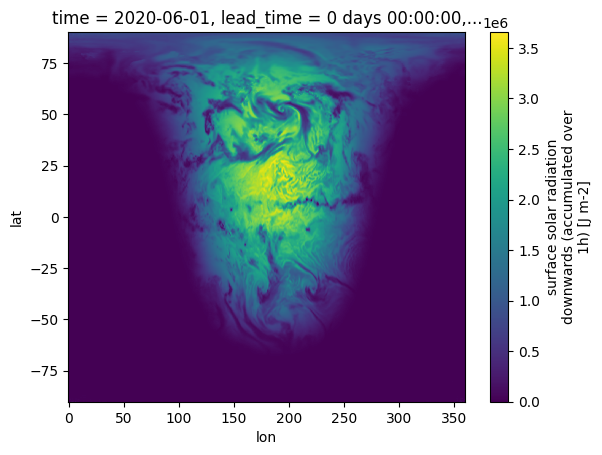

In [16]:
global_ssrd.ssrd.isel(time=0, lead_time=0).plot()